In [1]:
import os
import os, sys
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import Sequential
import torch.optim as optim
import voxelmorph as vxm
import neurite as ne
import scipy.ndimage

os.environ['VXM_BACKEND'] = 'pytorch'

backend:pytorch
Pytorch


In [2]:
os.environ.get('VXM_BACKEND')

'pytorch'

In [3]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cuda:0


In [4]:
# configure unet input shape (concatenation of moving and fixed images)
ndim = 3
unet_input_features = 2
# inshape = (*x_train.shape[1:], unet_input_features)

nb_features = [
    [32, 64, 64, 64, 64],
    [64, 64, 64, 64, 64, 32, 16, 16]
]

In [5]:
model = vxm.networks.VxmDense_128_256_256((128, 256, 256), nb_features, int_steps=0)
model.to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-4)
# model.load_state_dict(torch.load('model_VXM_3D_MInoBed_IFMIA.pth', map_location=device))
# model.load_state_dict(torch.load('model_VXM_3D_MInoBed_WaveletTest.pth', map_location=device))
# model.load_state_dict(torch.load('model_VXM_3D_MInoBed_256IFMIAMODEL.pth', map_location=device))
# model.load_state_dict(torch.load('model_VXM_3D_MInoBed_128256128LLL2.pth', map_location=device))
model.load_state_dict(torch.load(r"D:\Saito\            .pth", map_location=device))

transformer = vxm.layers.SpatialTransformer((64, 128, 128)).to(device)
transformer256 = vxm.layers.SpatialTransformer((128, 256, 256)).to(device)

[64, 128, 128]


c:\Users\user\anaconda3\envs\nn\lib\site-packages\torch\functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\TensorShape.cpp:3550.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [6]:
import torch

def haar_wavelet_3d(x):
    """
    x: torch.Tensor (B,1,D,H,W)
    return: torch.Tensor (B,8,D/2,H/2,W/2)
    """

    # 偶数・奇数インデックス
    x000 = x[:, :, 0::2, 0::2, 0::2]
    x001 = x[:, :, 0::2, 0::2, 1::2]
    x010 = x[:, :, 0::2, 1::2, 0::2]
    x011 = x[:, :, 0::2, 1::2, 1::2]
    x100 = x[:, :, 1::2, 0::2, 0::2]
    x101 = x[:, :, 1::2, 0::2, 1::2]
    x110 = x[:, :, 1::2, 1::2, 0::2]
    x111 = x[:, :, 1::2, 1::2, 1::2]

    # Haar 係数（正規化つき）
    LLL = (x000 + x001 + x010 + x011 + x100 + x101 + x110 + x111) / 8
    LLH = (x000 - x001 + x010 - x011 + x100 - x101 + x110 - x111) / 8
    LHL = (x000 + x001 - x010 - x011 + x100 + x101 - x110 - x111) / 8
    LHH = (x000 - x001 - x010 + x011 + x100 - x101 - x110 + x111) / 8
    HLL = (x000 + x001 + x010 + x011 - x100 - x101 - x110 - x111) / 8
    HLH = (x000 - x001 + x010 - x011 - x100 + x101 - x110 + x111) / 8
    HHL = (x000 + x001 - x010 - x011 - x100 - x101 + x110 + x111) / 8
    HHH = (x000 - x001 - x010 + x011 - x100 + x101 + x110 - x111) / 8

    return torch.cat(
        [LLL, LLH, LHL, LHH, HLL, HLH, HHL, HHH],
        dim=1
    )

def inverse_haar_wavelet_3d(x):
    """
    x: torch.Tensor (B,8,D/2,H/2,W/2)
    return: torch.Tensor (B,1,D,H,W)
    """

    B, _, D, H, W = x.shape
    device = x.device

    LLL, LLH, LHL, LHH, HLL, HLH, HHL, HHH = torch.chunk(x, 8, dim=1)

    out = torch.zeros(
        (B, 1, D * 2, H * 2, W * 2),
        device=device,
        dtype=x.dtype
    )

    out[:, :, 0::2, 0::2, 0::2] = (
        LLL + LLH + LHL + LHH + HLL + HLH + HHL + HHH
    )
    out[:, :, 0::2, 0::2, 1::2] = (
        LLL - LLH + LHL - LHH + HLL - HLH + HHL - HHH
    )
    out[:, :, 0::2, 1::2, 0::2] = (
        LLL + LLH - LHL - LHH + HLL + HLH - HHL - HHH
    )
    out[:, :, 0::2, 1::2, 1::2] = (
        LLL - LLH - LHL + LHH + HLL - HLH - HHL + HHH
    )
    out[:, :, 1::2, 0::2, 0::2] = (
        LLL + LLH + LHL + LHH - HLL - HLH - HHL - HHH
    )
    out[:, :, 1::2, 0::2, 1::2] = (
        LLL - LLH + LHL - LHH - HLL + HLH - HHL + HHH
    )
    out[:, :, 1::2, 1::2, 0::2] = (
        LLL + LLH - LHL - LHH - HLL - HLH + HHL + HHH
    )
    out[:, :, 1::2, 1::2, 1::2] = (
        LLL - LLH - LHL + LHH - HLL + HLH + HHL - HHH
    )

    return out


In [7]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt

from pytorch_msssim import ms_ssim
CT_MIN, CT_MAX = -1200.0, 3146.98

def compute_rmse(x, y):
    
    x = x * (CT_MAX - CT_MIN) + CT_MIN
    y = y * (CT_MAX - CT_MIN) + CT_MIN
    return torch.sqrt(torch.mean((x - y) ** 2)).item()


def compute_dice(x, y, eps=1e-6):
    """
    x, y: torch.Tensor (1,D,H,W) binary
    """
    x = (x > 0.5).float()
    y = (y > 0.5).float()

    inter = torch.sum(x * y)
    union = torch.sum(x) + torch.sum(y)

    return (2 * inter / (union + eps)).item()


In [8]:
import os
import glob
import matplotlib.pyplot as plt
from pytorch_msssim import ms_ssim

def process_pair(
    pair_folder,
    model,
    transformer,
    device,
    all_results,
    slice_z=64,
    visualize=True
):
    npz_files = sorted(glob.glob(os.path.join(pair_folder, '*.npz')))
    if len(npz_files) != 2:
        print(f"[Skip] {pair_folder} に .npz ファイルが2つ存在しません")
        return

    # =========================
    # load（★指定コード準拠）
    # =========================
    moving = np.load(npz_files[1])['Train'][np.newaxis, ..., np.newaxis]
    fixed  = np.load(npz_files[0])['Train'][np.newaxis, ..., np.newaxis]

    moving_t = torch.tensor(moving).permute(0, 4, 1, 2, 3).float().to(device)
    fixed_t  = torch.tensor(fixed ).permute(0, 4, 1, 2, 3).float().to(device)

    model.eval()

    with torch.no_grad():

        # =========================
        # Wavelet
        # =========================
        moving_w = haar_wavelet_3d(moving_t)
        fixed_w  = haar_wavelet_3d(fixed_t)

        # =========================
        # VoxelMorph
        # =========================
        Vec = model(moving_w, fixed_w)

        # =========================
        # Warp each band
        # =========================
        warped_w = []
        for ch in range(8):
            warped = transformer(moving_w[:, ch:ch+1], Vec)
            warped_w.append(warped)

        warped_w = torch.cat(warped_w, dim=1)

        # =========================
        # Inverse Wavelet
        # =========================
        warped = inverse_haar_wavelet_3d(warped_w)

        # =========================
        # Metrics
        # =========================
        rmse = compute_rmse(warped, fixed_t)

        msssim_val = ms_ssim(
            warped, fixed_t,
            data_range=1.0,
            size_average=True,
            win_size=7
        ).item()

        dice = compute_dice(warped, fixed_t)

        all_results.append({
            "pair": os.path.basename(pair_folder),
            "RMSE": rmse,
            "MS_SSIM": msssim_val,
            "Dice": dice
        })

        print(
            f"{os.path.basename(pair_folder)} | "
            f"RMSE={rmse:.4f} | "
            f"MS-SSIM={msssim_val:.4f} | "
            f"Dice={dice:.4f}"
        )

        # =========================
        # Visualization
        # =========================
        if visualize:
            fig, axs = plt.subplots(1, 3, figsize=(12, 4))

            axs[0].imshow(moving_t[0, 0, slice_z].cpu(), cmap="gray")
            axs[0].set_title("Moving")

            axs[1].imshow(fixed_t[0, 0, slice_z].cpu(), cmap="gray")
            axs[1].set_title("Fixed")

            axs[2].imshow(warped[0, 0, slice_z].cpu(), cmap="gray")
            axs[2].set_title("Warped")

            for ax in axs:
                ax.axis("off")

            plt.suptitle(os.path.basename(pair_folder))
            plt.show()


pair1 | RMSE=428.7194 | MS-SSIM=0.9349 | Dice=0.9173


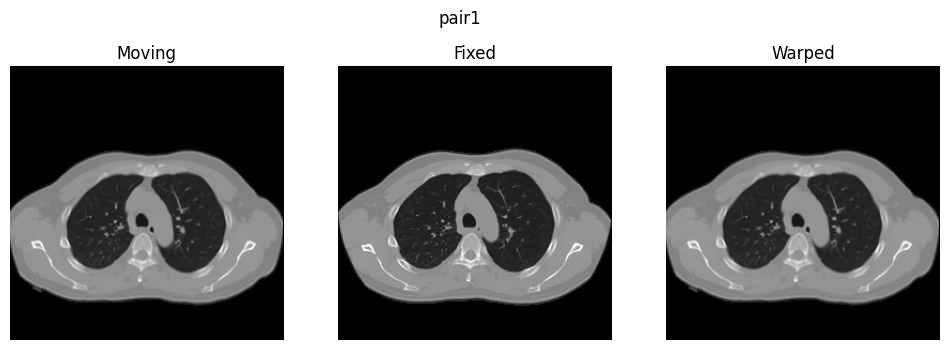

pair2 | RMSE=302.8293 | MS-SSIM=0.9344 | Dice=0.9254


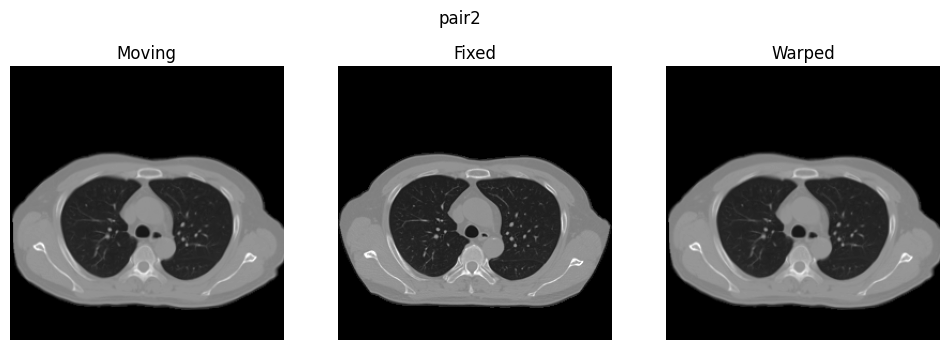

pair3 | RMSE=434.0305 | MS-SSIM=0.9271 | Dice=0.9092


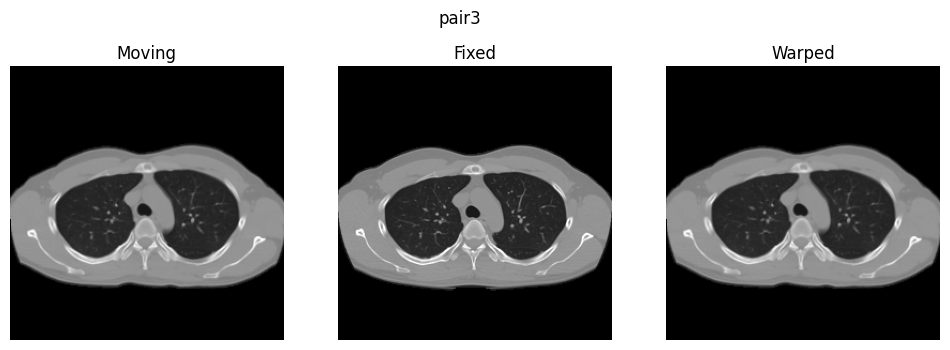

pair4 | RMSE=329.2537 | MS-SSIM=0.9228 | Dice=0.9358


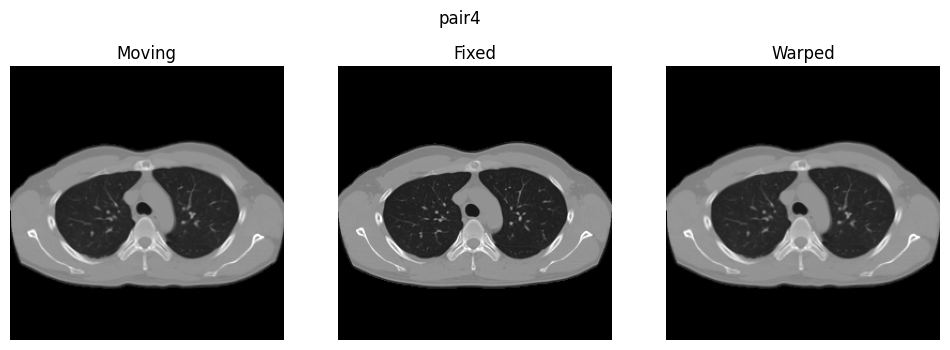

pair5 | RMSE=323.7226 | MS-SSIM=0.9079 | Dice=0.9334


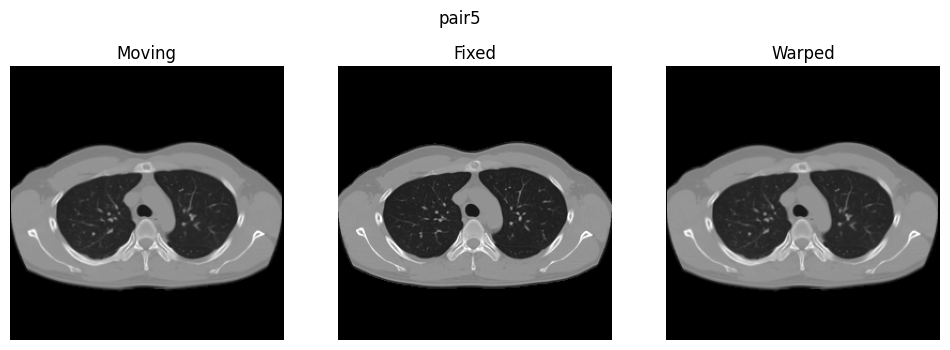

pair6 | RMSE=304.1496 | MS-SSIM=0.9274 | Dice=0.9239


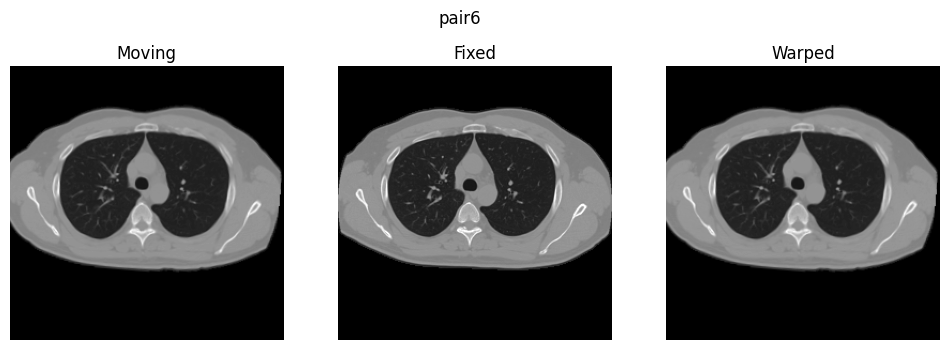

pair7 | RMSE=410.8638 | MS-SSIM=0.9293 | Dice=0.9089


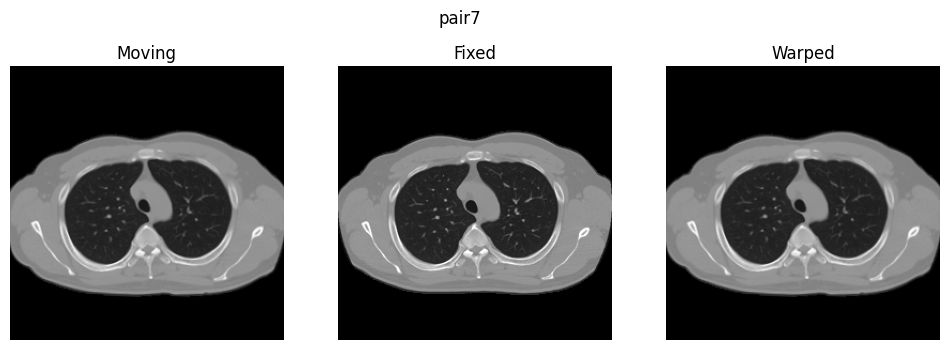

pair8 | RMSE=426.3787 | MS-SSIM=0.9280 | Dice=0.9085


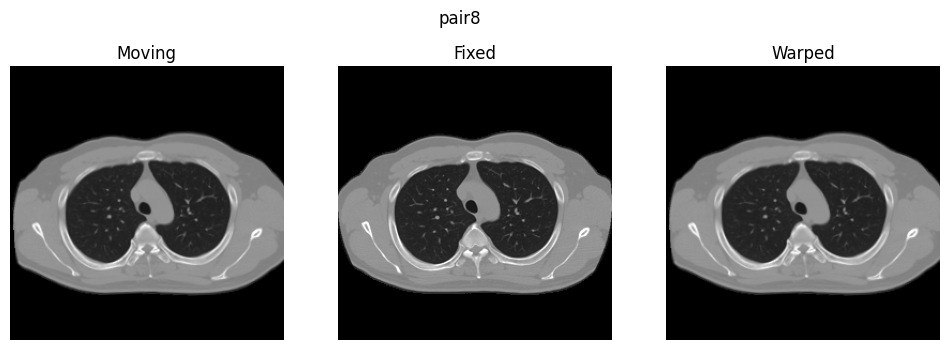

pair9 | RMSE=330.8051 | MS-SSIM=0.9142 | Dice=0.9132


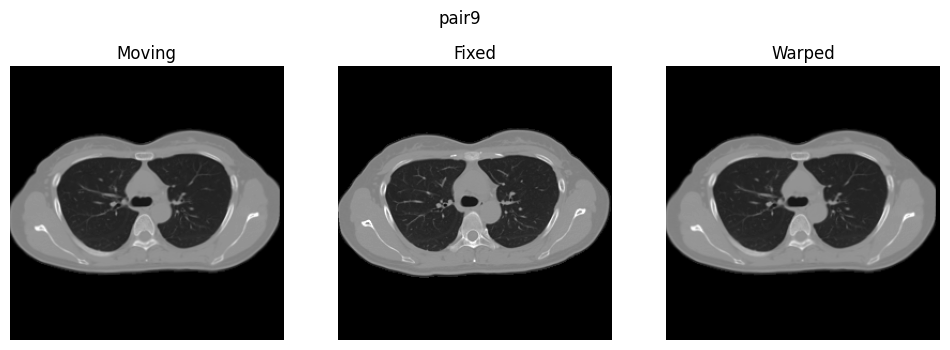

pair10 | RMSE=366.0167 | MS-SSIM=0.8933 | Dice=0.8974


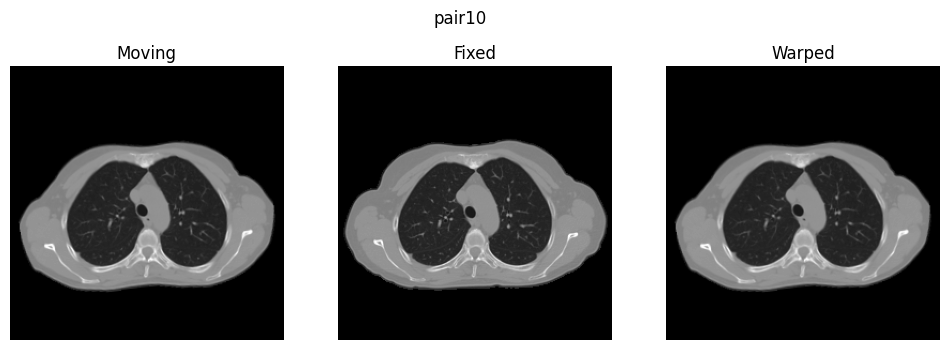

pair11 | RMSE=391.4350 | MS-SSIM=0.9285 | Dice=0.9201


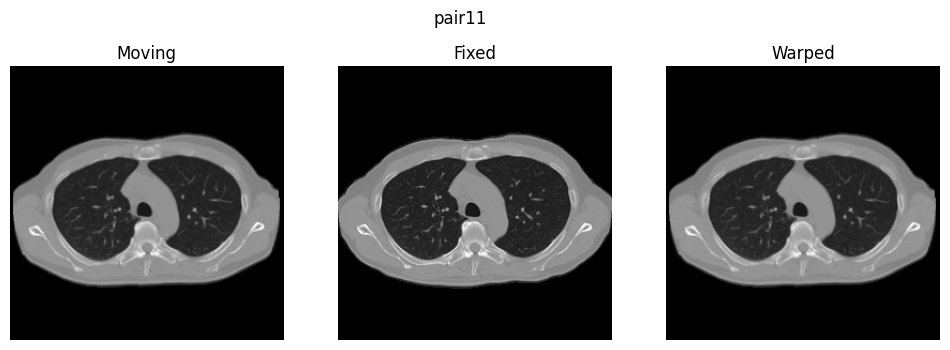

pair12 | RMSE=527.8714 | MS-SSIM=0.9149 | Dice=0.8886


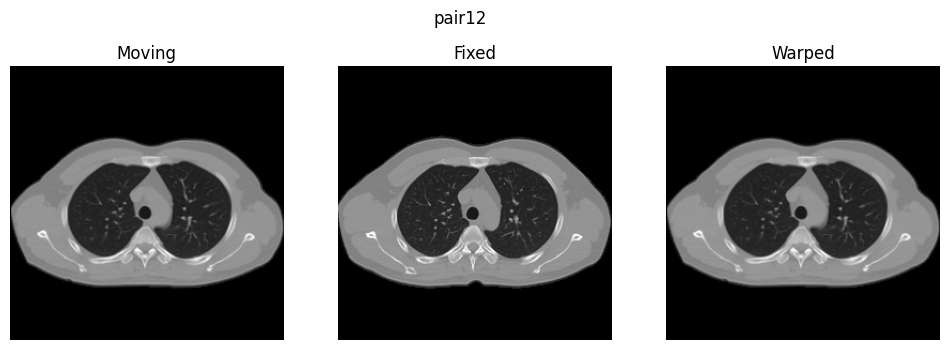

pair13 | RMSE=232.9768 | MS-SSIM=0.9635 | Dice=0.9410


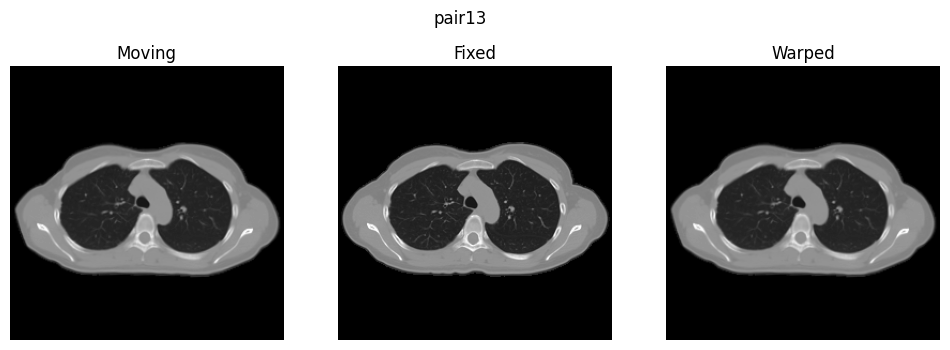

pair14 | RMSE=249.7453 | MS-SSIM=0.9535 | Dice=0.9348


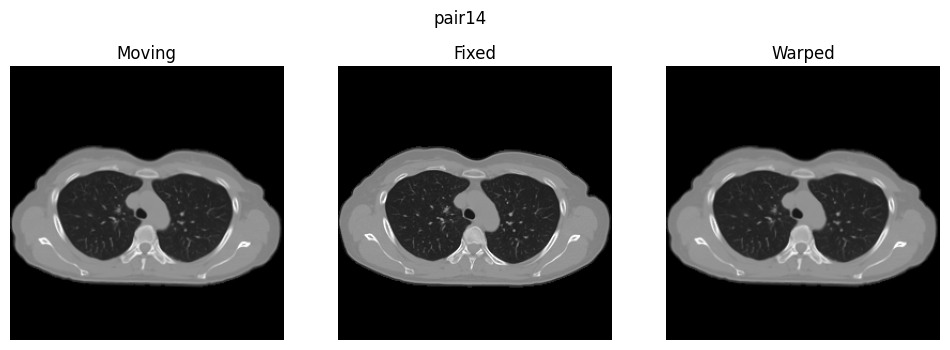

pair15 | RMSE=355.1195 | MS-SSIM=0.9117 | Dice=0.9310


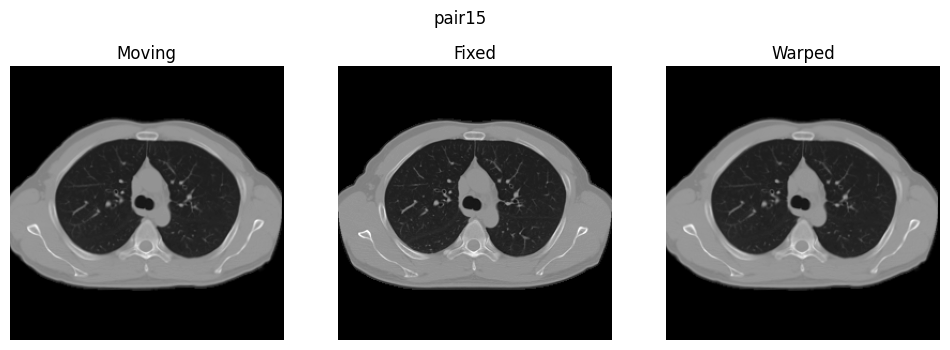

pair16 | RMSE=346.0318 | MS-SSIM=0.8936 | Dice=0.9101


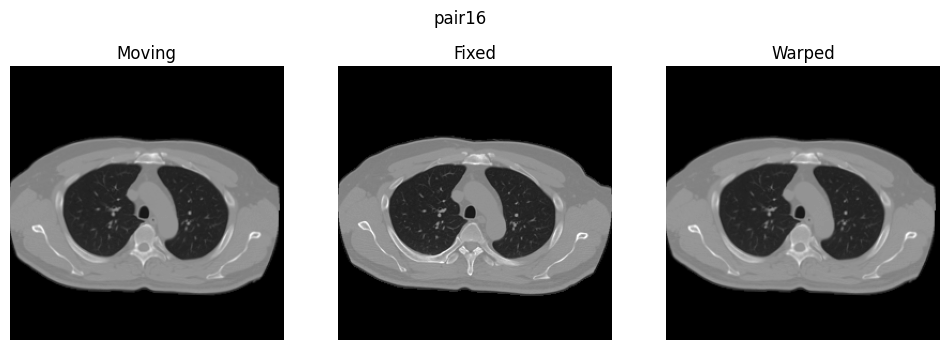

pair17 | RMSE=480.7682 | MS-SSIM=0.9095 | Dice=0.9138


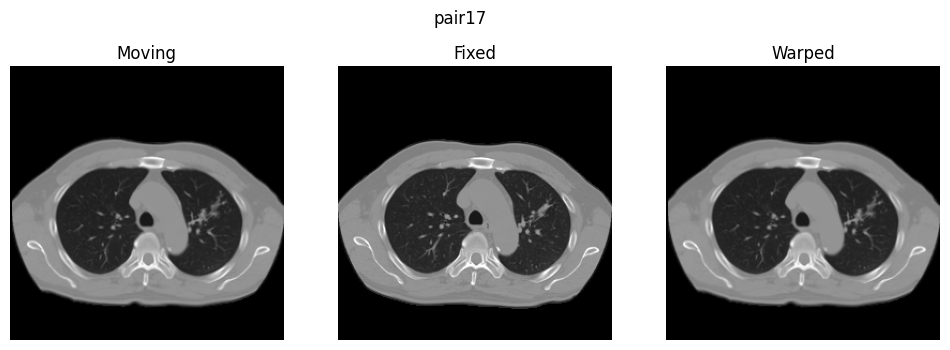

pair18 | RMSE=633.2867 | MS-SSIM=0.8077 | Dice=0.8655


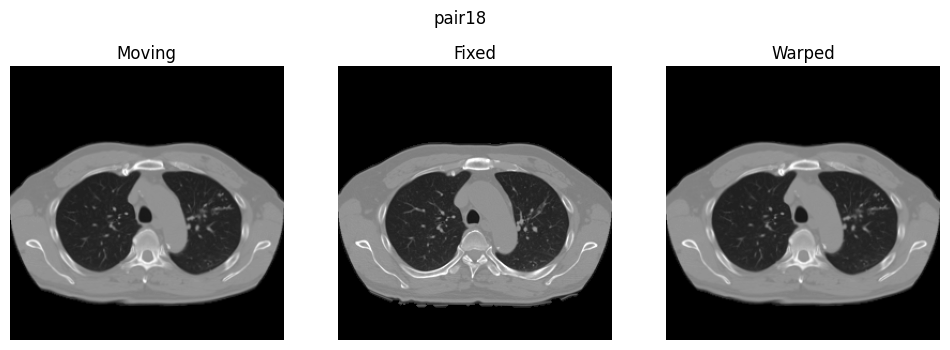

pair19 | RMSE=340.8868 | MS-SSIM=0.9323 | Dice=0.9362


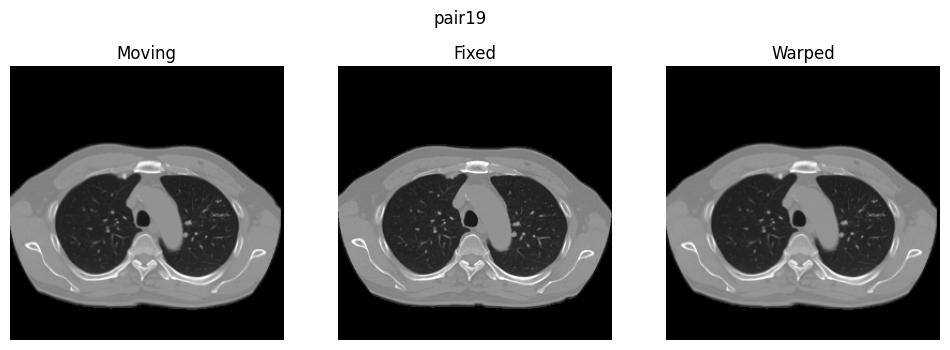

pair20 | RMSE=444.3719 | MS-SSIM=0.8543 | Dice=0.9117


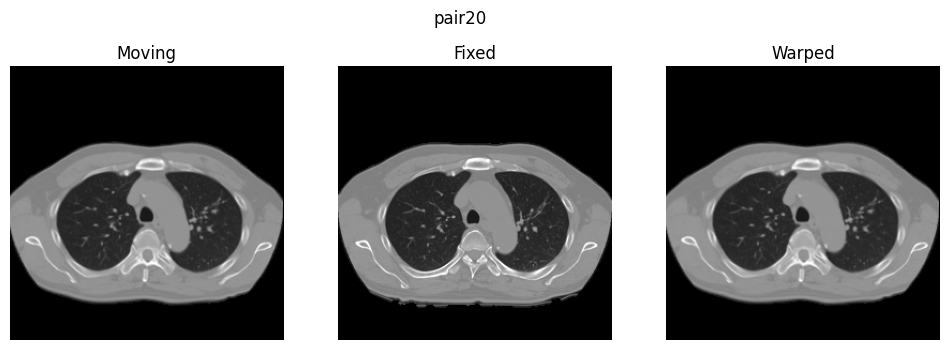

pair21 | RMSE=287.5770 | MS-SSIM=0.9519 | Dice=0.9451


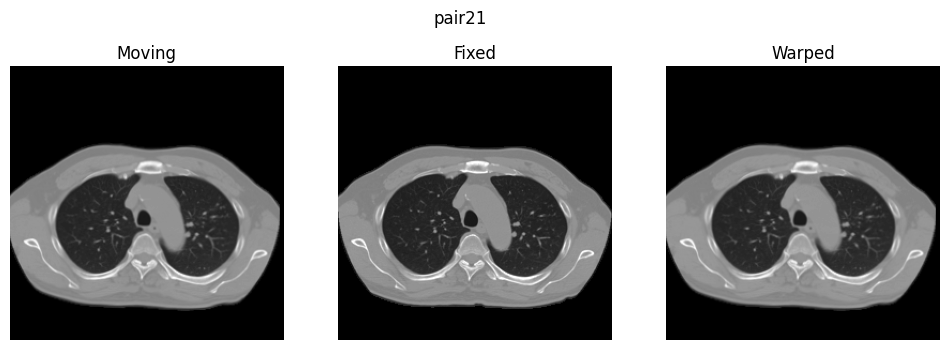

pair22 | RMSE=367.4432 | MS-SSIM=0.8570 | Dice=0.9257


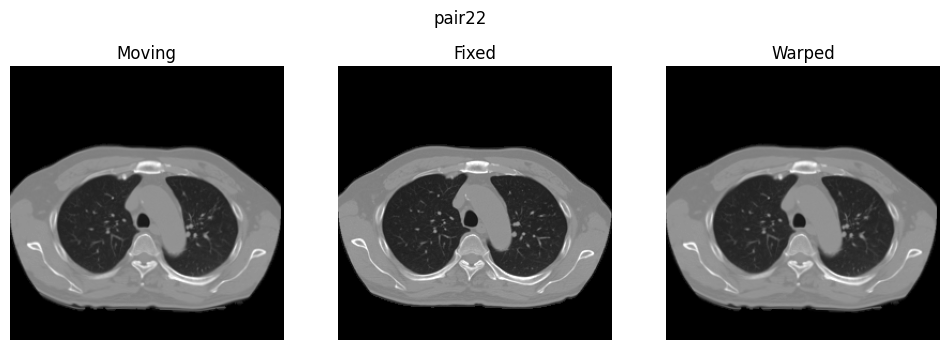

pair23 | RMSE=330.5768 | MS-SSIM=0.9265 | Dice=0.9377


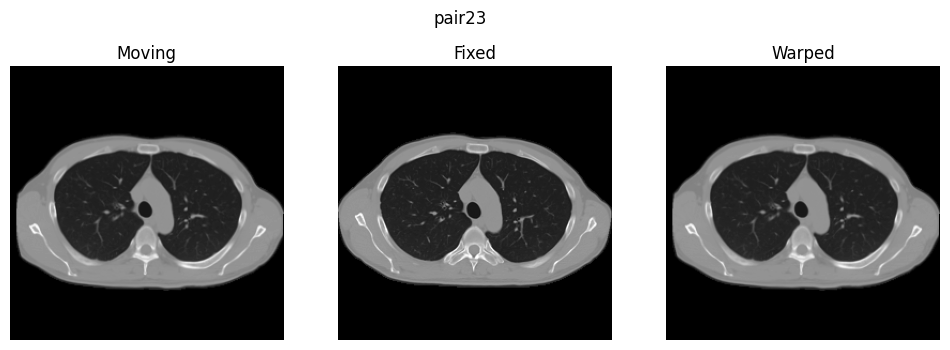

pair24 | RMSE=285.1484 | MS-SSIM=0.9310 | Dice=0.9481


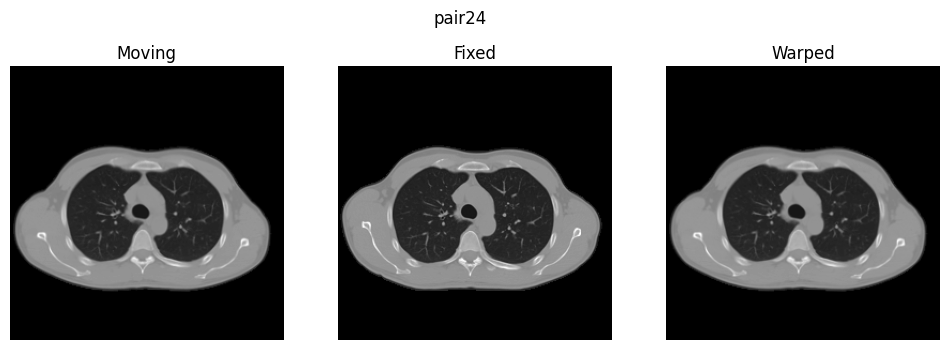

pair25 | RMSE=325.9072 | MS-SSIM=0.9264 | Dice=0.8885


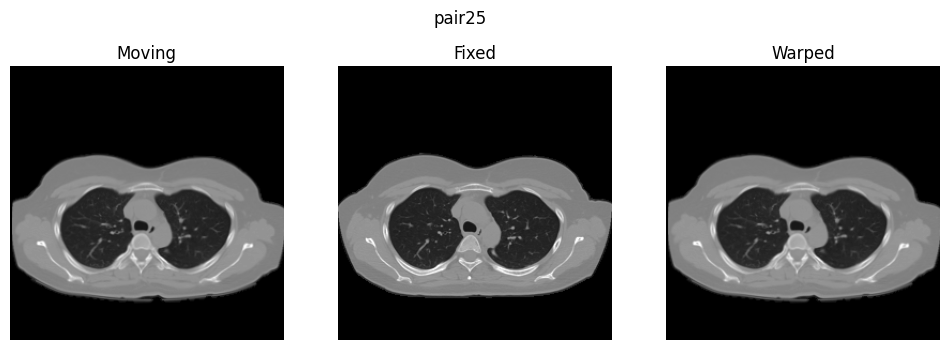

pair26 | RMSE=366.1289 | MS-SSIM=0.9007 | Dice=0.8879


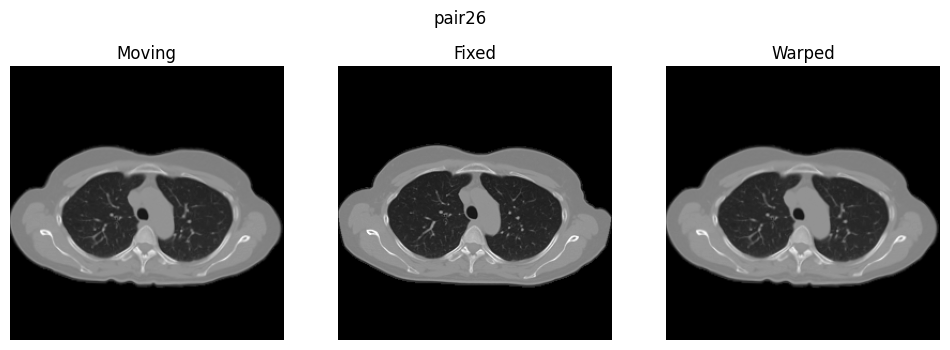

pair27 | RMSE=355.5195 | MS-SSIM=0.8876 | Dice=0.8895


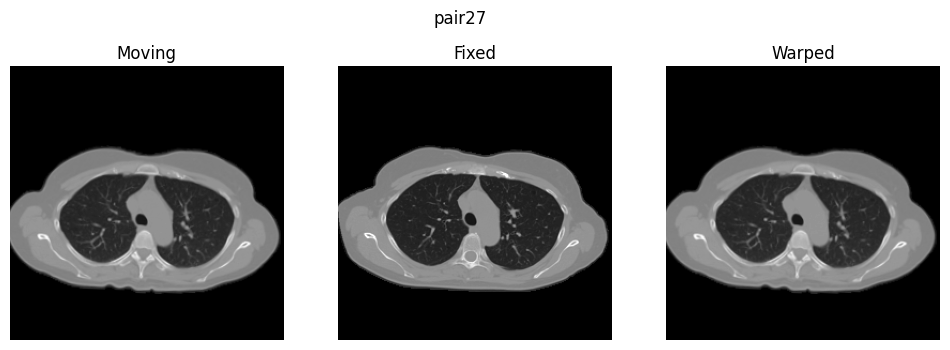

pair28 | RMSE=318.9914 | MS-SSIM=0.9314 | Dice=0.8972


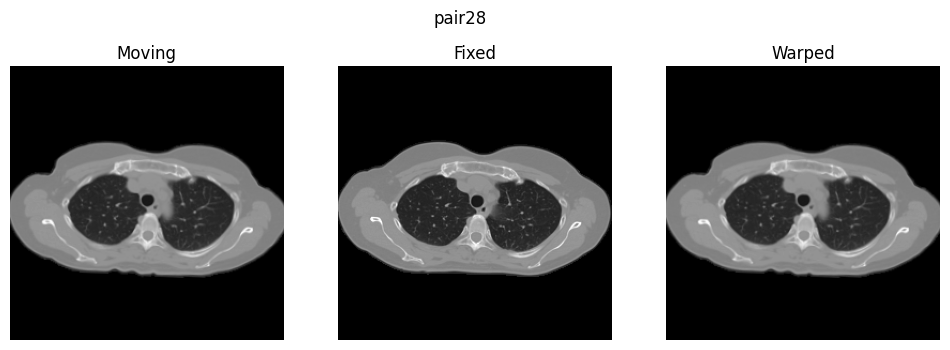

pair29 | RMSE=349.4472 | MS-SSIM=0.8918 | Dice=0.8894


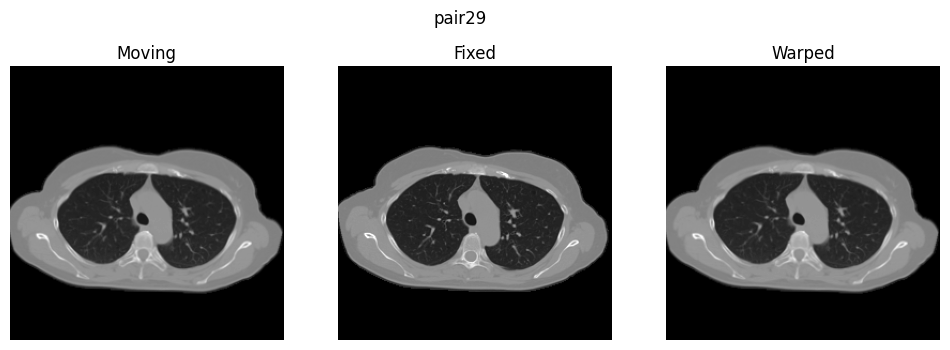

pair30 | RMSE=369.3519 | MS-SSIM=0.8887 | Dice=0.8799


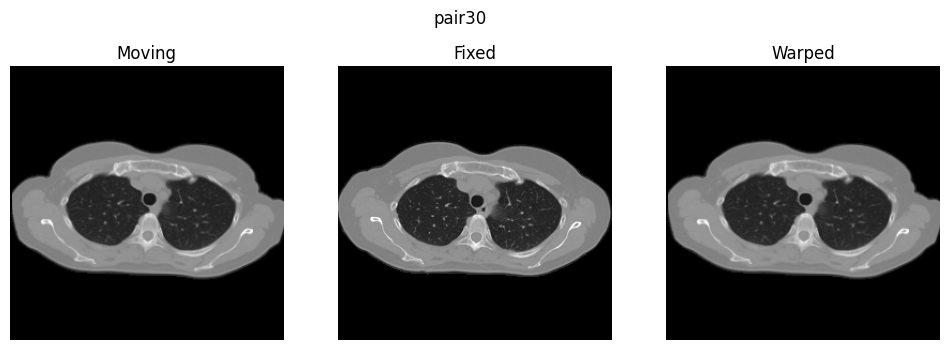

pair31 | RMSE=486.9207 | MS-SSIM=0.8843 | Dice=0.8521


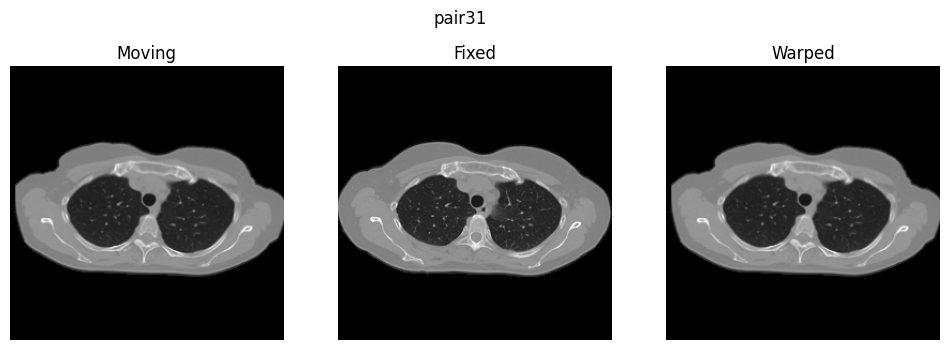

pair32 | RMSE=570.6763 | MS-SSIM=0.9092 | Dice=0.8550


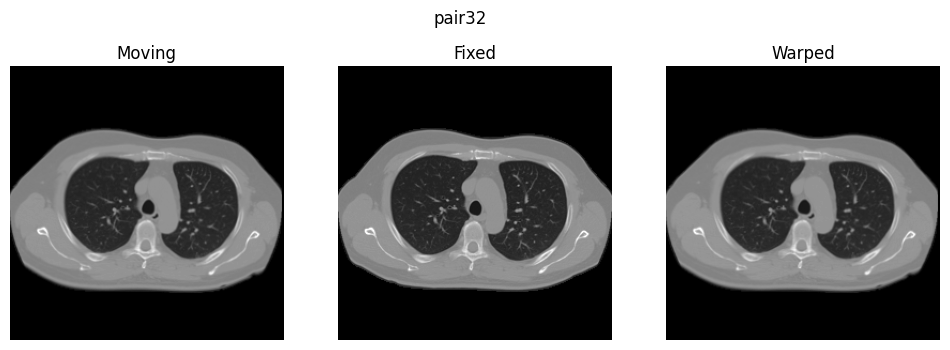

pair33 | RMSE=482.8682 | MS-SSIM=0.9012 | Dice=0.8759


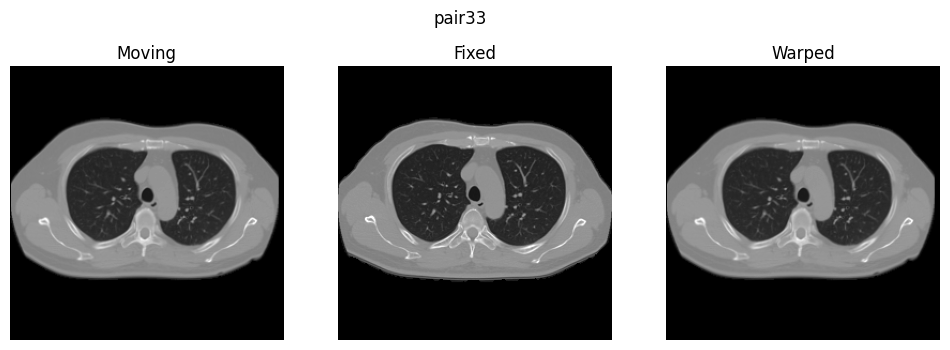

pair34 | RMSE=685.3422 | MS-SSIM=0.8044 | Dice=0.8128


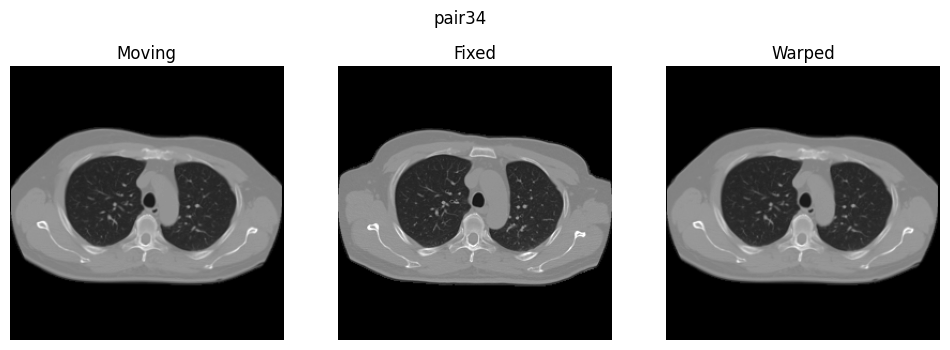

pair35 | RMSE=291.5100 | MS-SSIM=0.9244 | Dice=0.9088


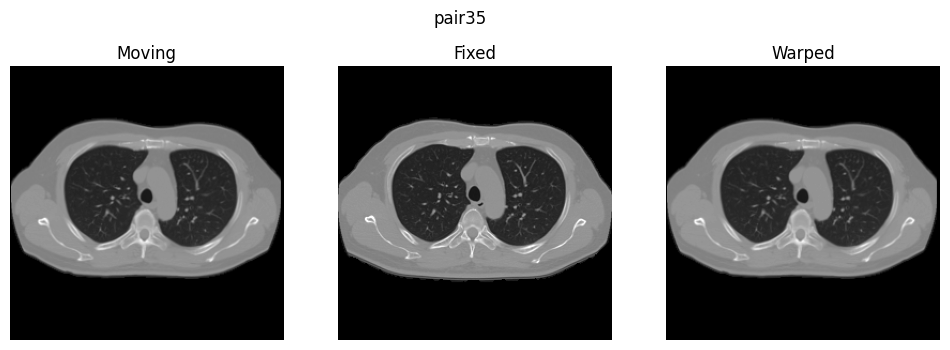

pair36 | RMSE=469.4257 | MS-SSIM=0.8246 | Dice=0.8672


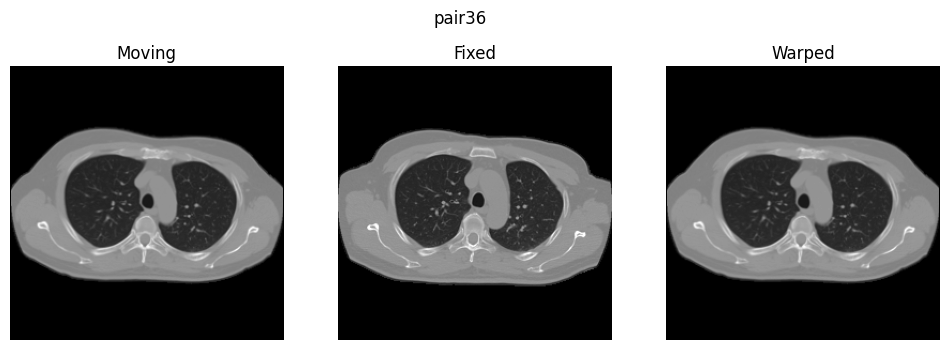

pair37 | RMSE=573.9941 | MS-SSIM=0.8134 | Dice=0.8517


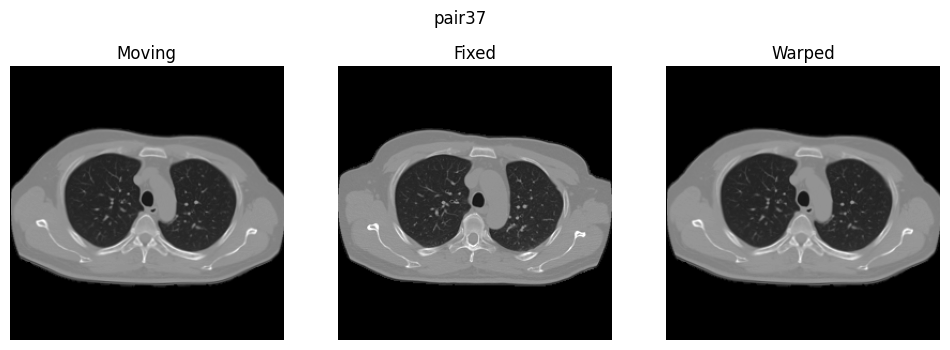

pair38 | RMSE=414.7184 | MS-SSIM=0.8622 | Dice=0.9083


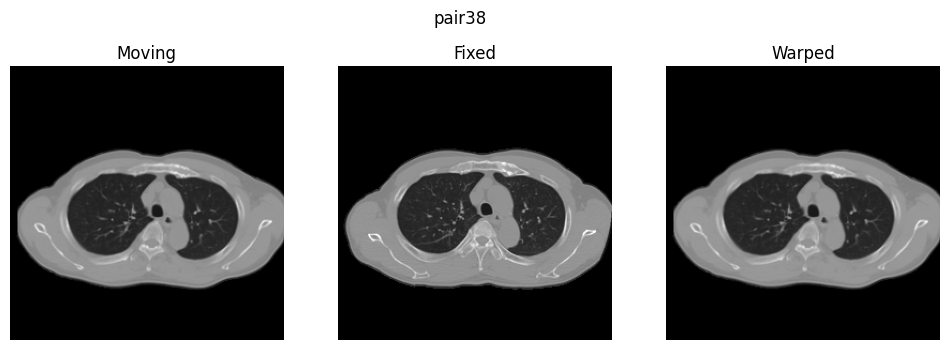

pair39 | RMSE=385.5984 | MS-SSIM=0.8694 | Dice=0.9047


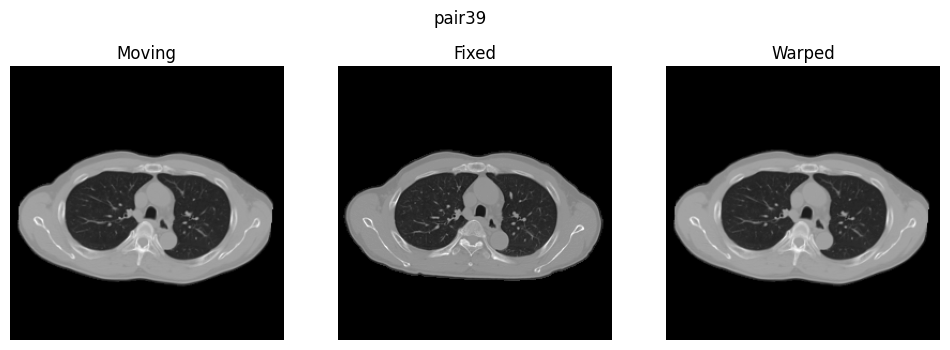

pair40 | RMSE=431.1215 | MS-SSIM=0.9163 | Dice=0.9087


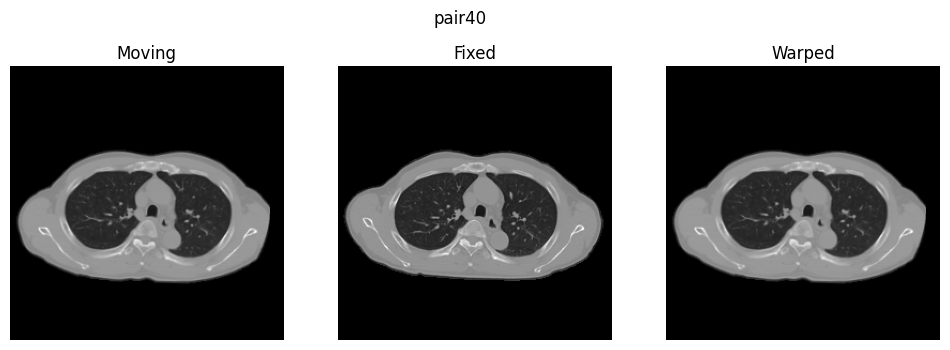

pair41 | RMSE=288.0696 | MS-SSIM=0.9469 | Dice=0.9390


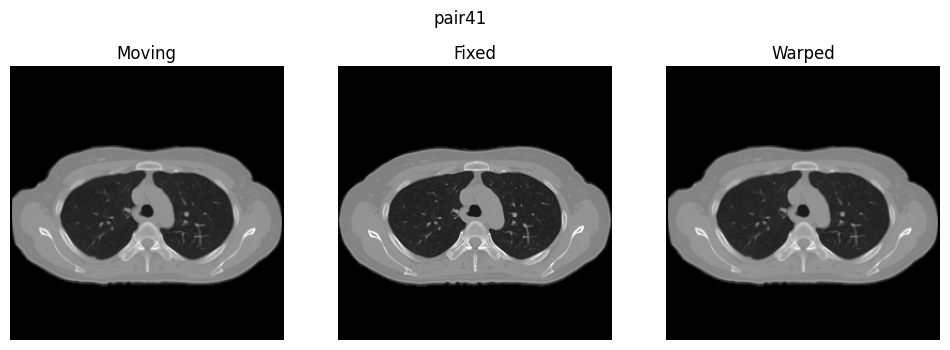

pair42 | RMSE=296.8643 | MS-SSIM=0.9211 | Dice=0.9222


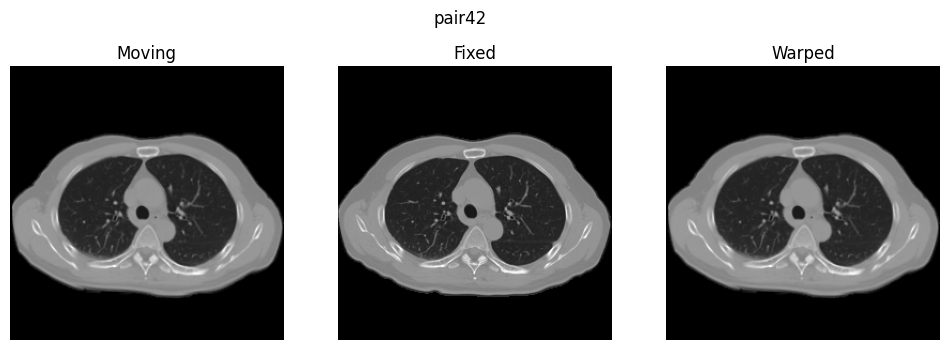

pair43 | RMSE=510.0560 | MS-SSIM=0.8668 | Dice=0.8627


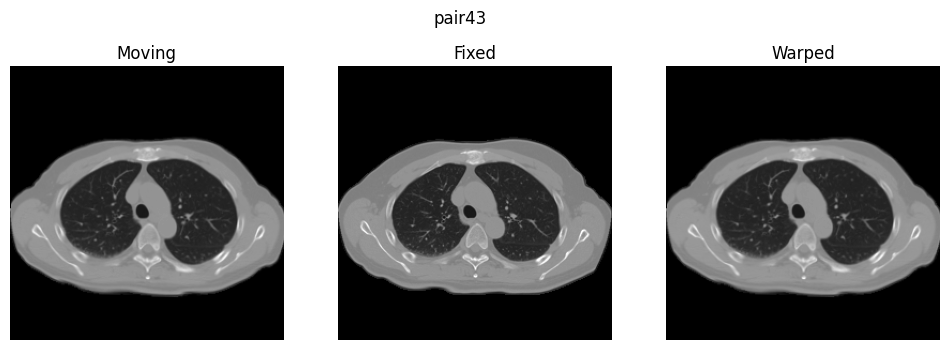

pair44 | RMSE=587.3096 | MS-SSIM=0.8460 | Dice=0.8411


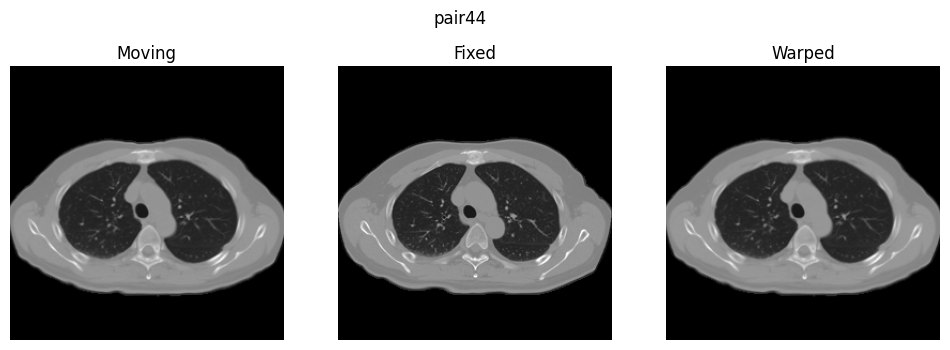

pair45 | RMSE=237.6307 | MS-SSIM=0.9463 | Dice=0.9146


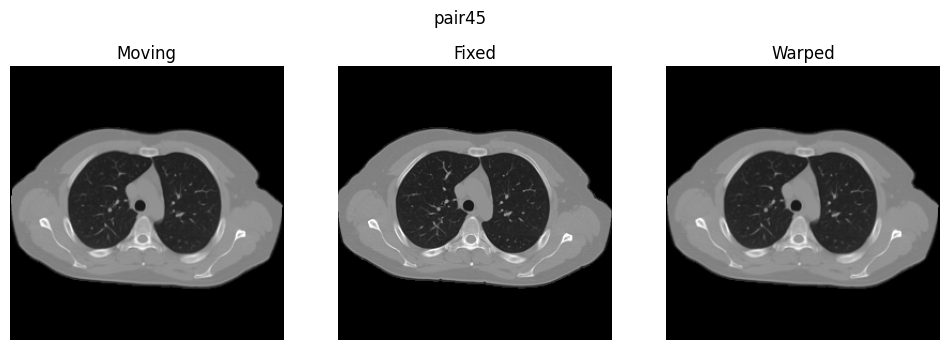

pair46 | RMSE=554.9578 | MS-SSIM=0.9181 | Dice=0.8439


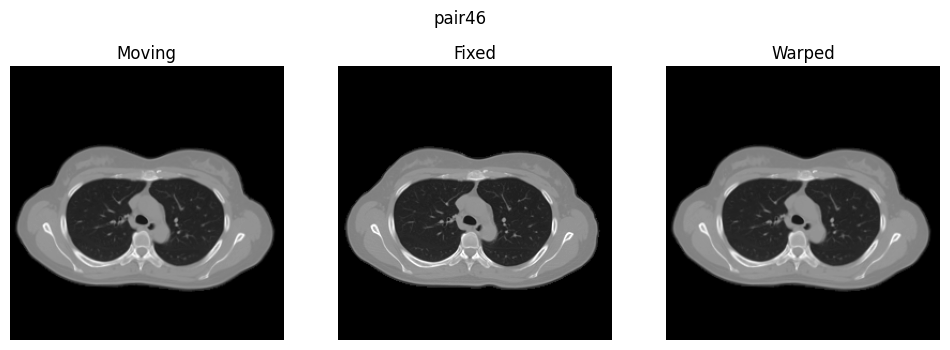

pair47 | RMSE=515.8364 | MS-SSIM=0.8913 | Dice=0.8855


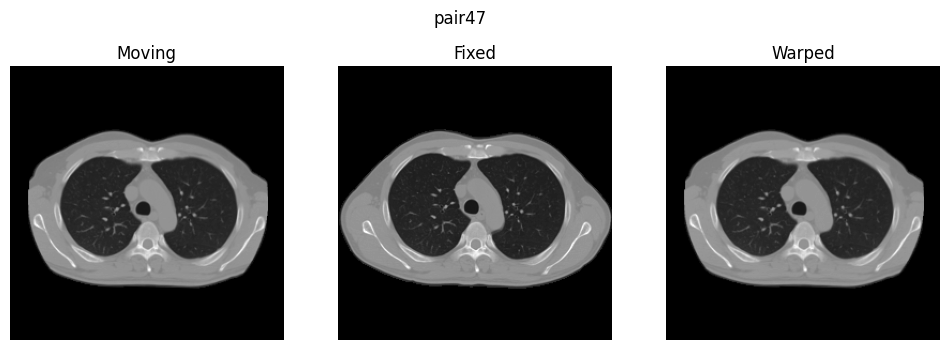

pair48 | RMSE=569.1431 | MS-SSIM=0.8940 | Dice=0.8750


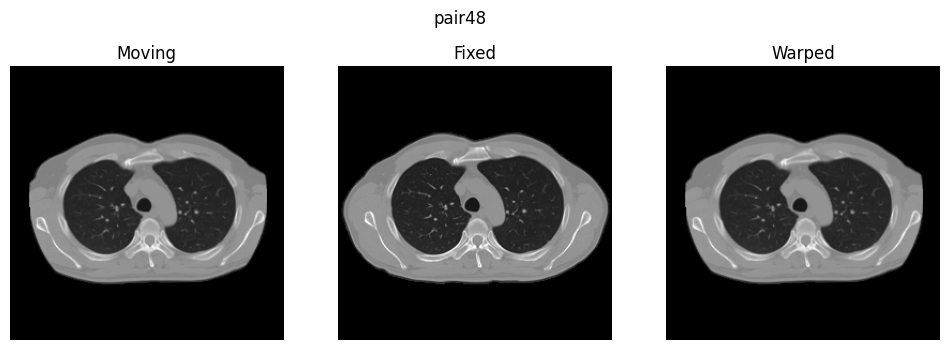

pair49 | RMSE=611.8877 | MS-SSIM=0.9010 | Dice=0.8622


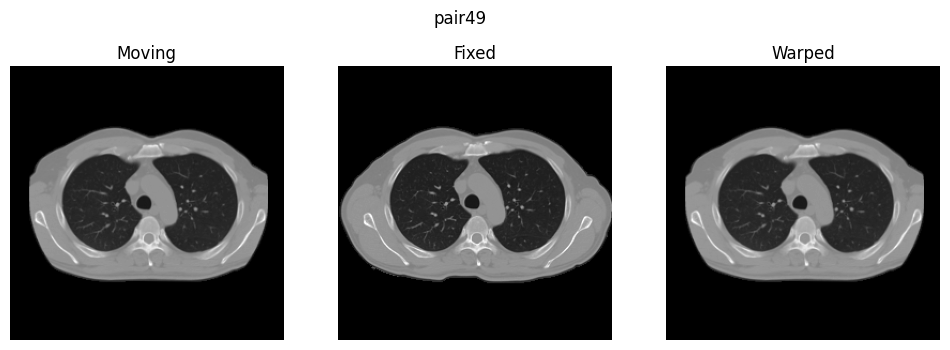

pair50 | RMSE=546.3085 | MS-SSIM=0.8888 | Dice=0.8781


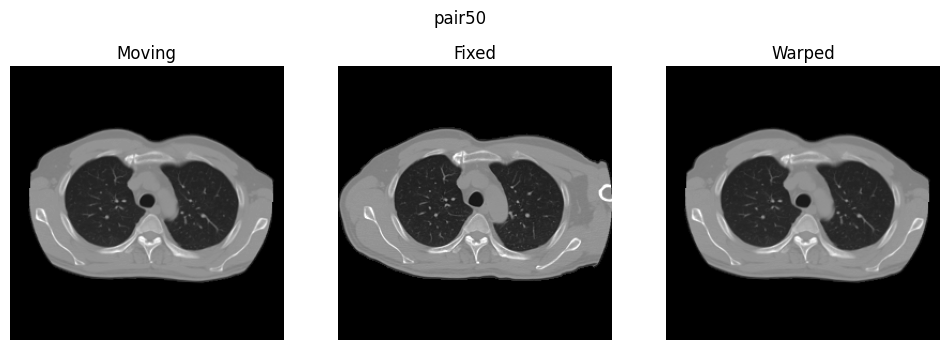

pair51 | RMSE=657.9369 | MS-SSIM=0.8564 | Dice=0.8460


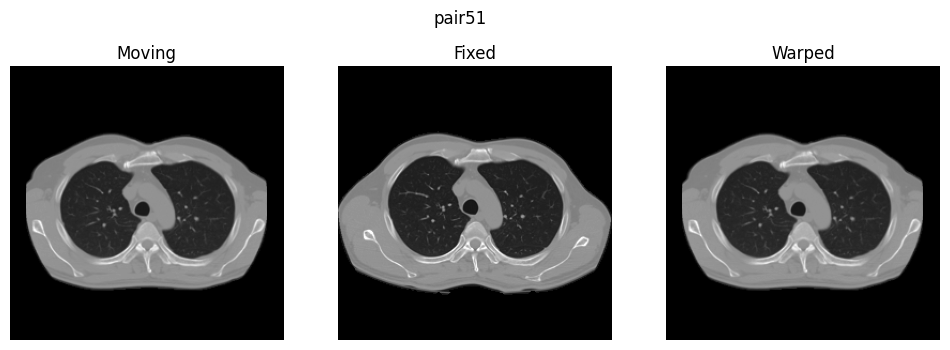

pair52 | RMSE=403.3666 | MS-SSIM=0.9361 | Dice=0.9250


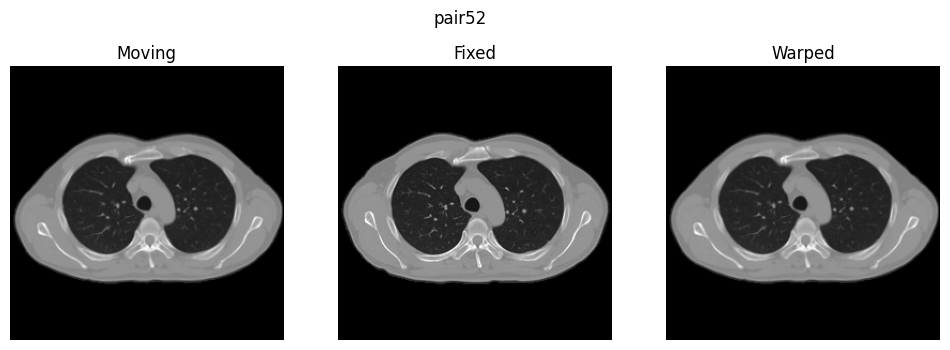

pair53 | RMSE=464.3470 | MS-SSIM=0.9256 | Dice=0.9032


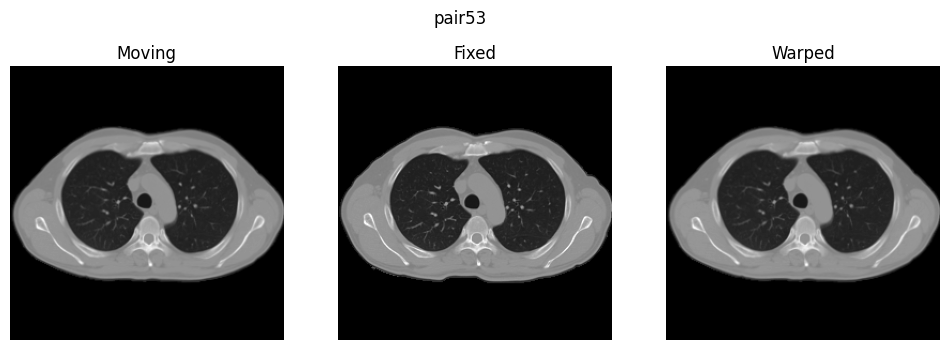

pair54 | RMSE=513.5651 | MS-SSIM=0.8572 | Dice=0.8804


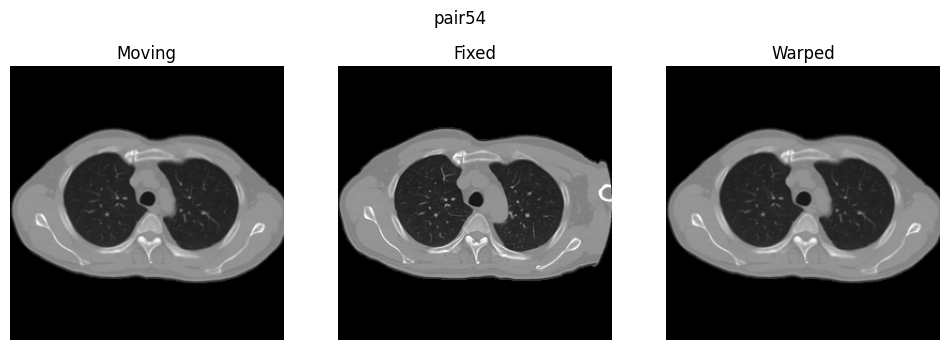

pair55 | RMSE=497.7284 | MS-SSIM=0.9103 | Dice=0.9029


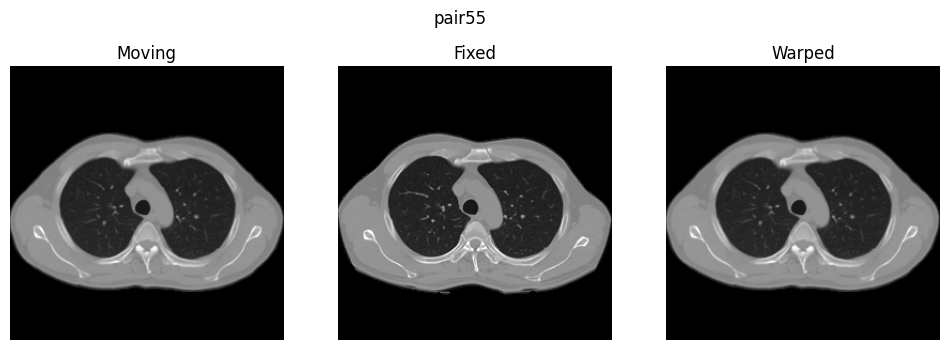

pair56 | RMSE=382.6668 | MS-SSIM=0.9262 | Dice=0.9240


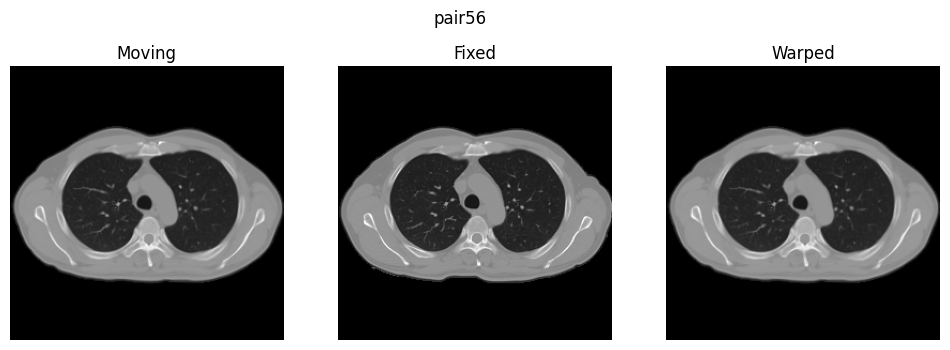

pair57 | RMSE=464.4245 | MS-SSIM=0.8645 | Dice=0.8949


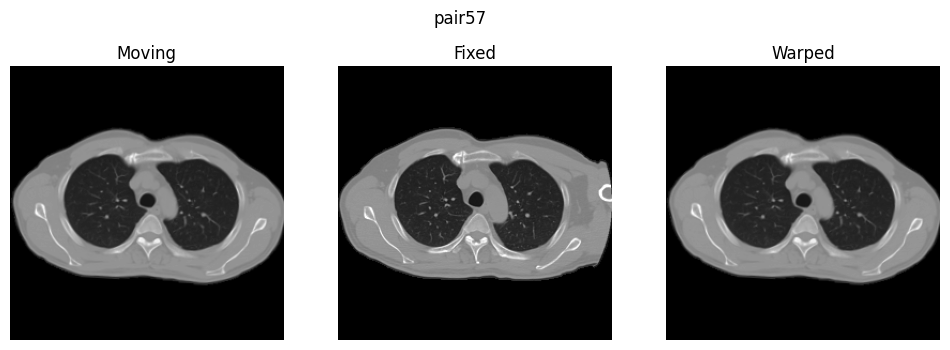

pair58 | RMSE=446.4746 | MS-SSIM=0.9009 | Dice=0.9154


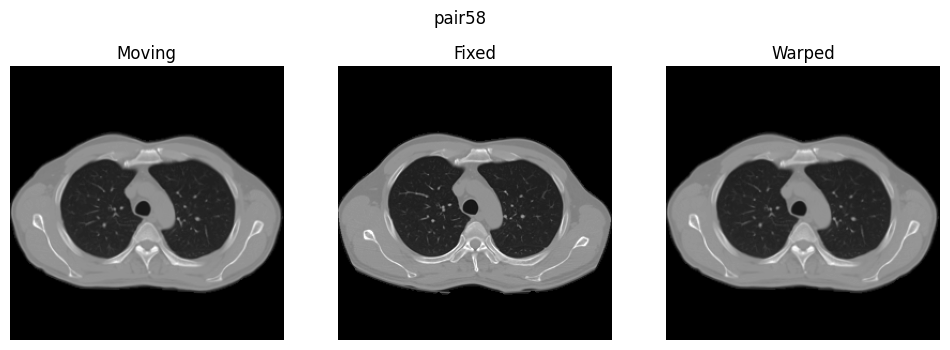

pair59 | RMSE=435.3850 | MS-SSIM=0.8889 | Dice=0.9035


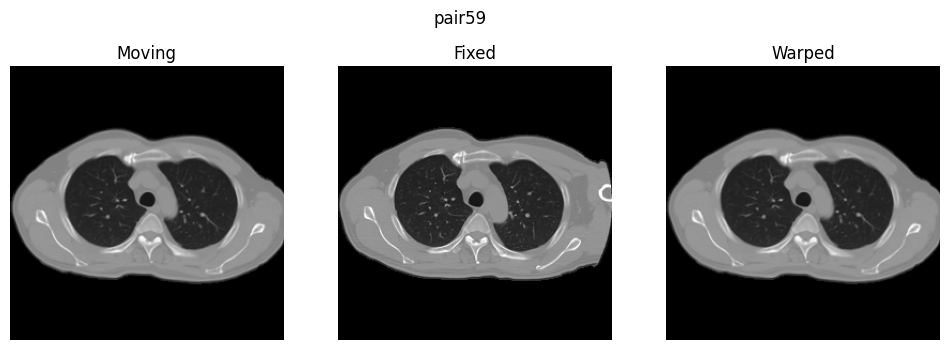

pair60 | RMSE=392.4889 | MS-SSIM=0.9133 | Dice=0.9261


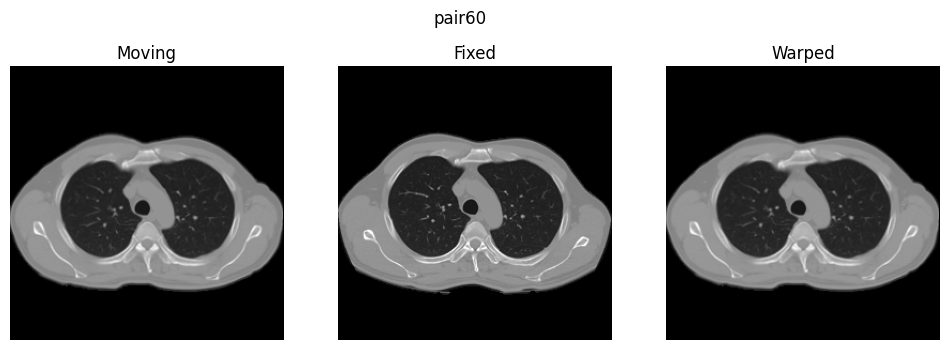

pair61 | RMSE=663.7525 | MS-SSIM=0.8286 | Dice=0.8440


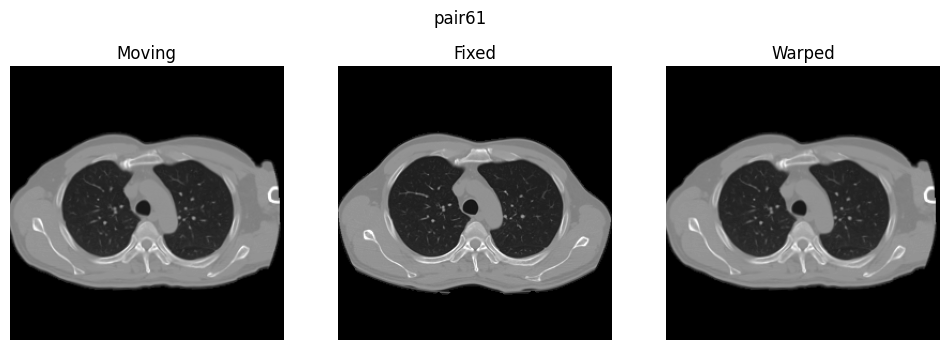

pair62 | RMSE=561.5485 | MS-SSIM=0.8980 | Dice=0.8766


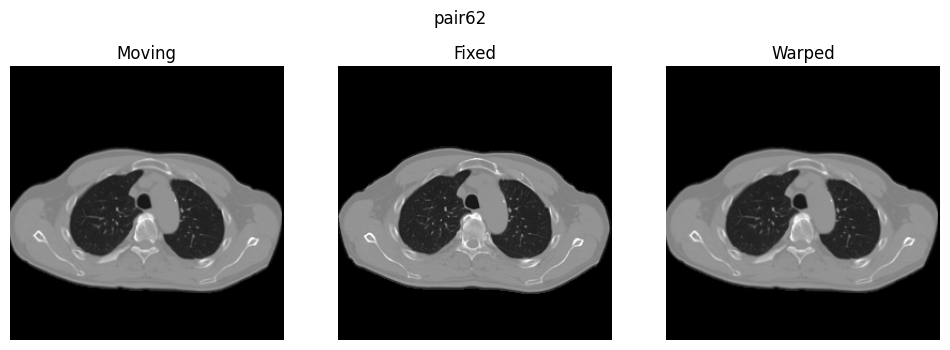

pair63 | RMSE=308.9435 | MS-SSIM=0.9307 | Dice=0.9354


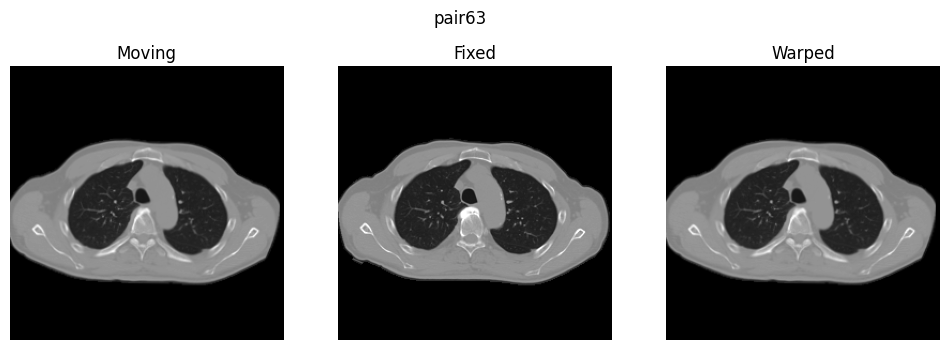

pair64 | RMSE=257.1198 | MS-SSIM=0.9446 | Dice=0.9427


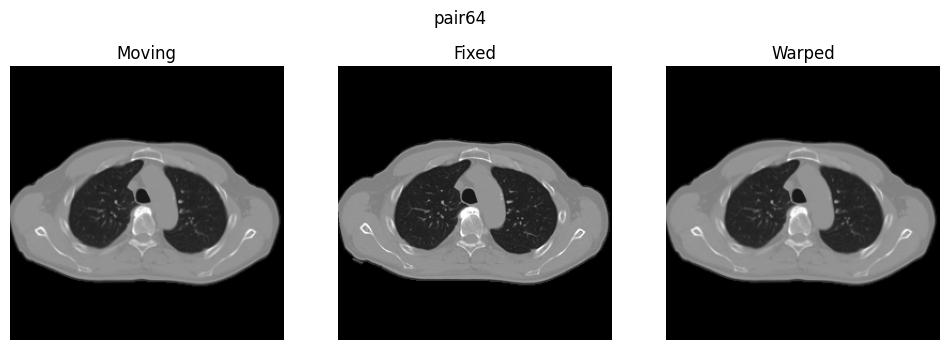

pair65 | RMSE=269.1475 | MS-SSIM=0.9427 | Dice=0.9348


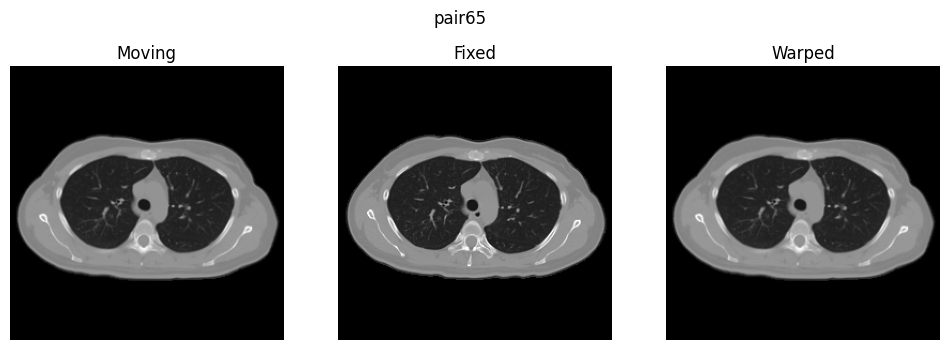

pair66 | RMSE=585.4187 | MS-SSIM=0.8850 | Dice=0.8658


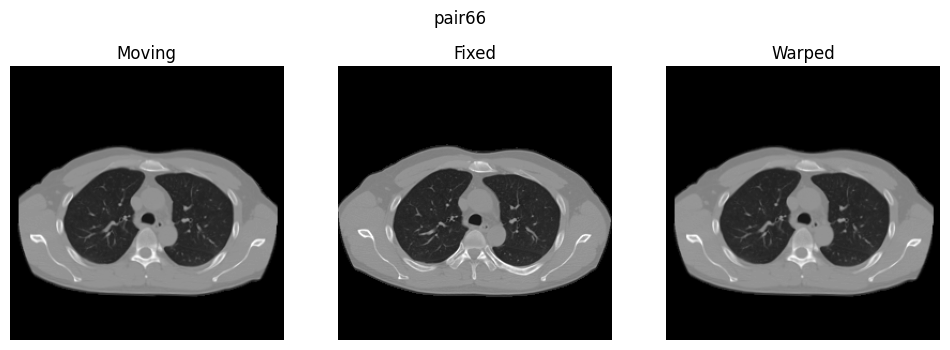

pair67 | RMSE=457.6785 | MS-SSIM=0.9224 | Dice=0.9137


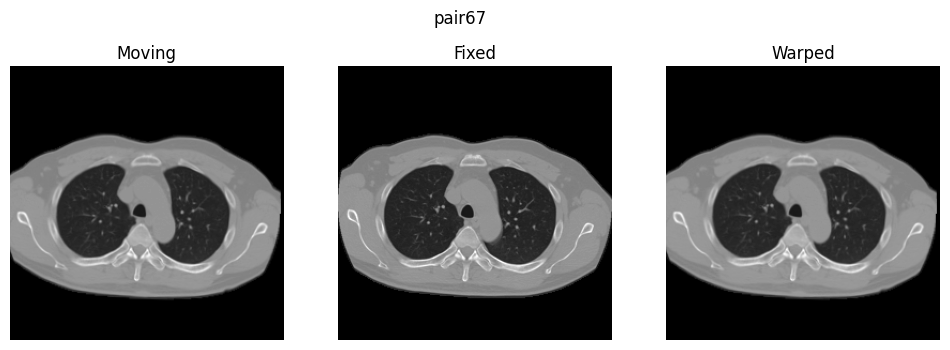

pair68 | RMSE=398.9000 | MS-SSIM=0.8918 | Dice=0.9056


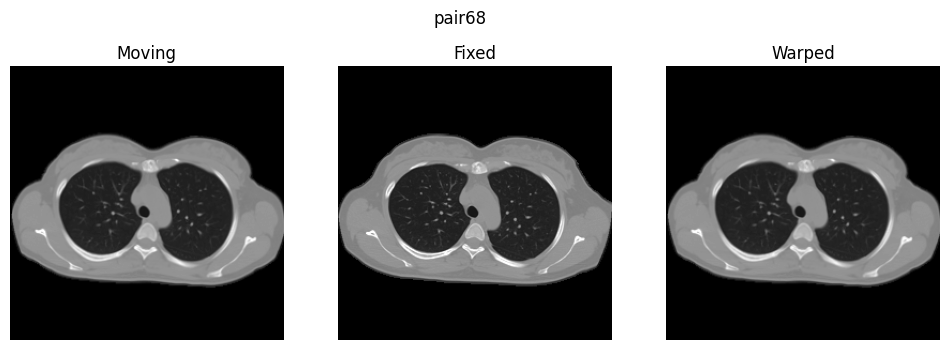

pair69 | RMSE=358.8986 | MS-SSIM=0.9128 | Dice=0.8871


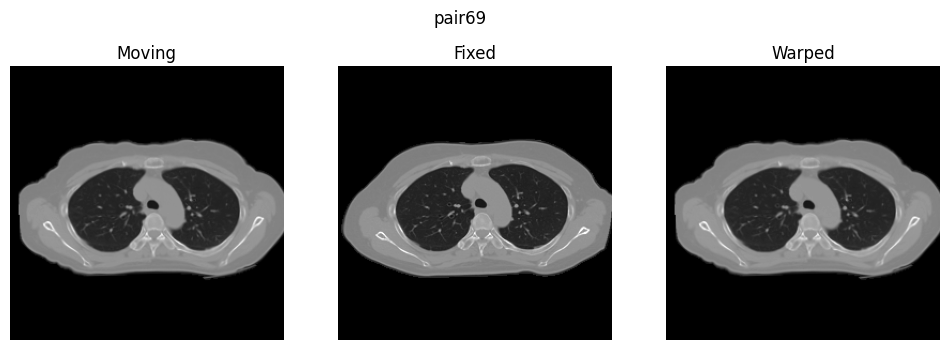

pair70 | RMSE=313.1502 | MS-SSIM=0.9191 | Dice=0.8880


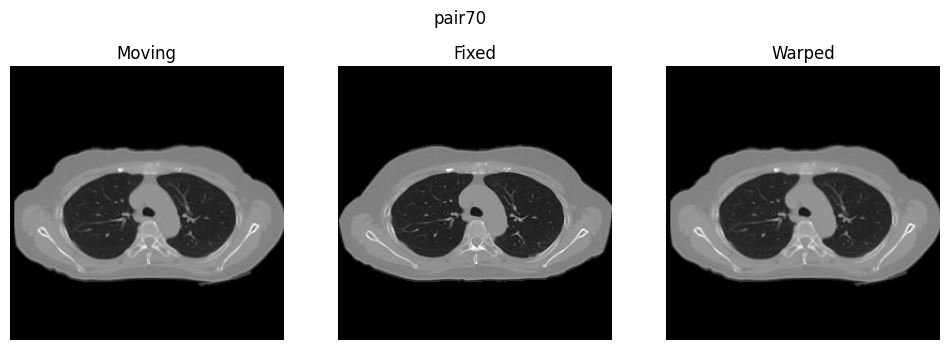

pair71 | RMSE=279.9333 | MS-SSIM=0.9412 | Dice=0.8885


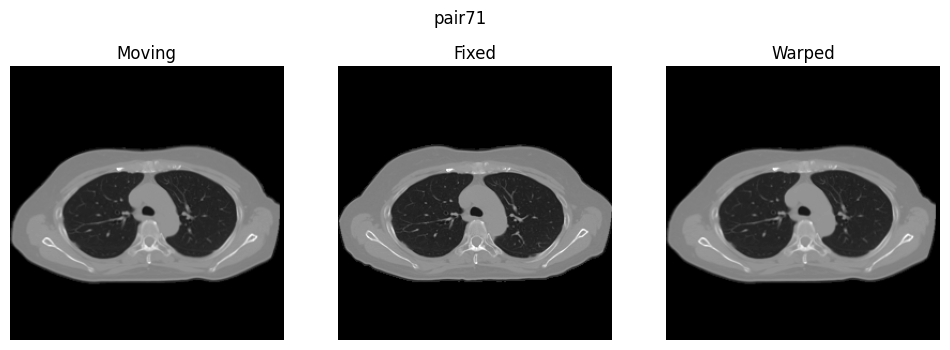

pair72 | RMSE=718.6584 | MS-SSIM=0.8354 | Dice=0.8263


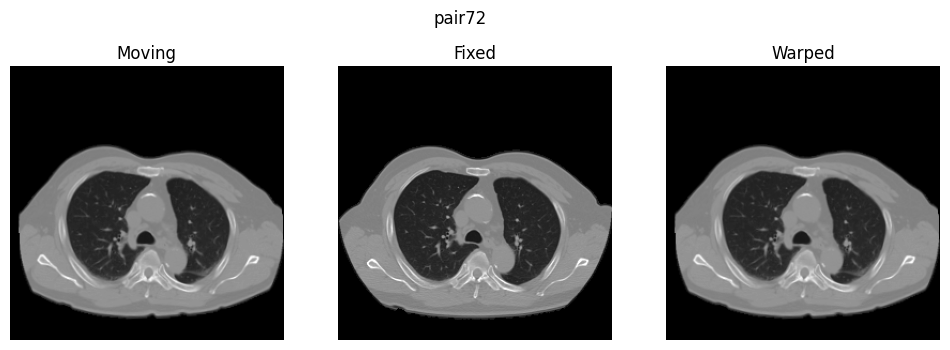

pair73 | RMSE=586.5699 | MS-SSIM=0.8387 | Dice=0.8639


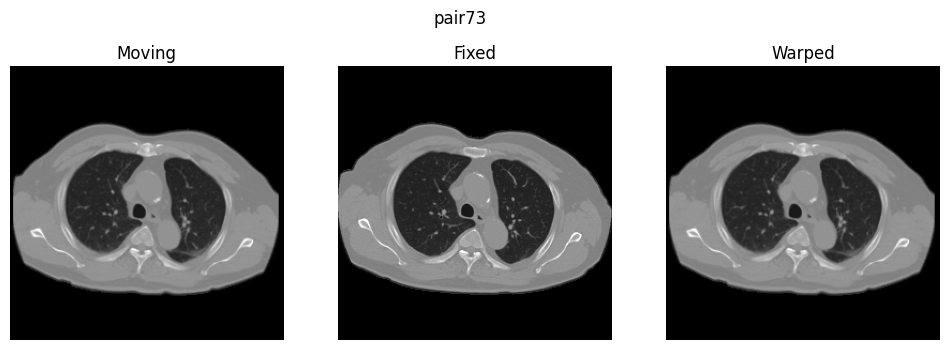

pair74 | RMSE=412.7221 | MS-SSIM=0.8761 | Dice=0.8915


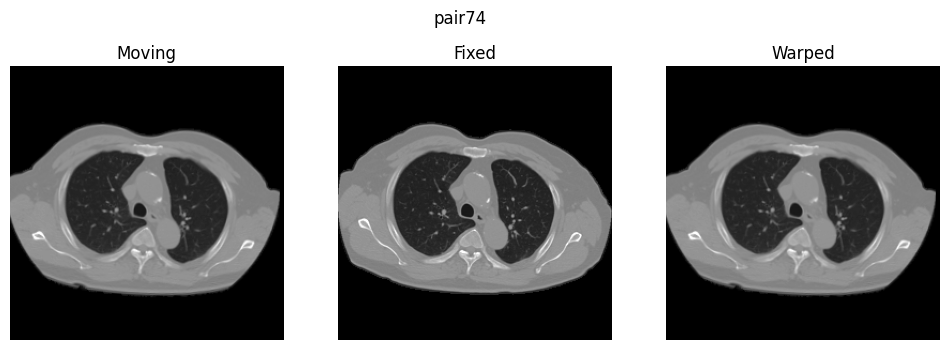

pair75 | RMSE=347.3923 | MS-SSIM=0.9478 | Dice=0.9298


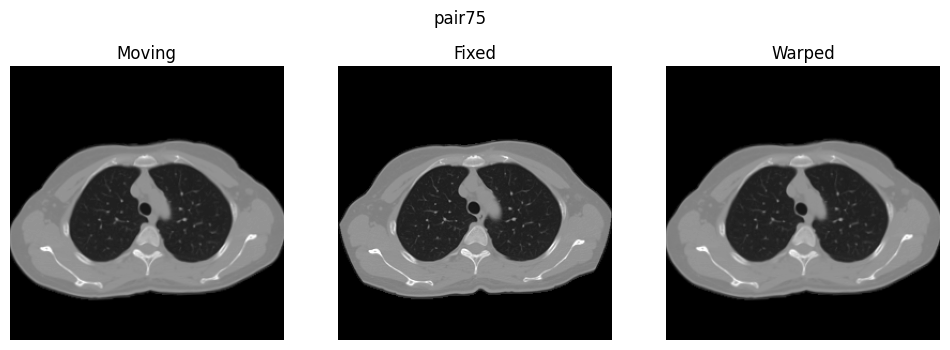

pair76 | RMSE=419.0304 | MS-SSIM=0.9093 | Dice=0.8789


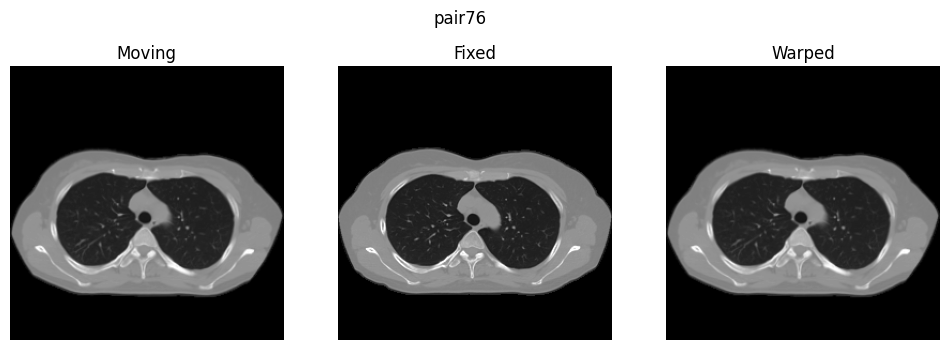

pair77 | RMSE=816.7617 | MS-SSIM=0.7864 | Dice=0.7830


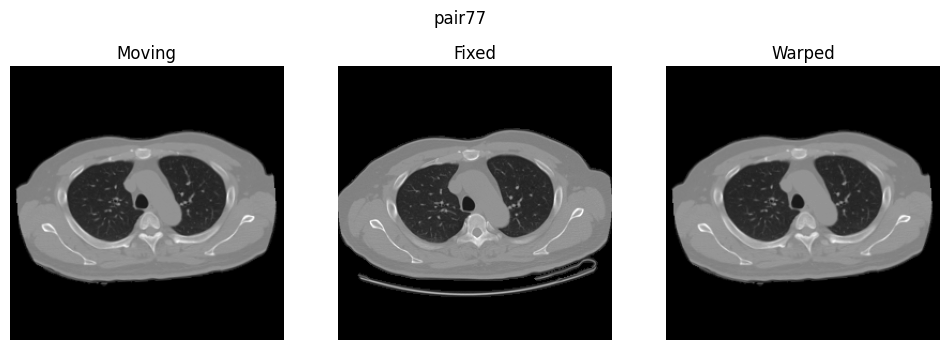

pair78 | RMSE=849.6180 | MS-SSIM=0.7611 | Dice=0.7617


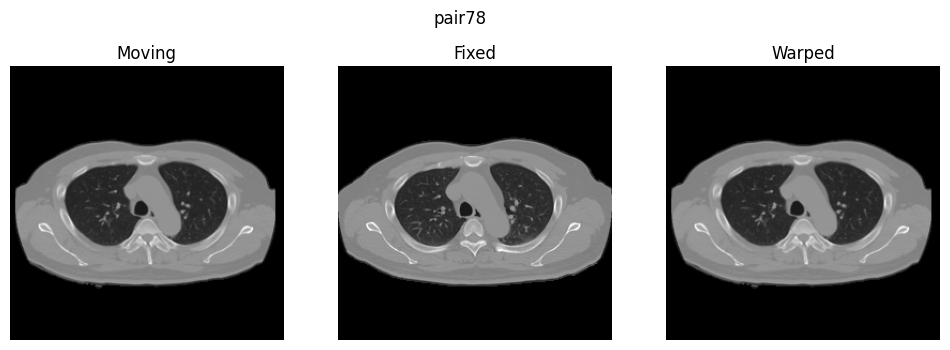

pair79 | RMSE=770.6083 | MS-SSIM=0.8104 | Dice=0.8016


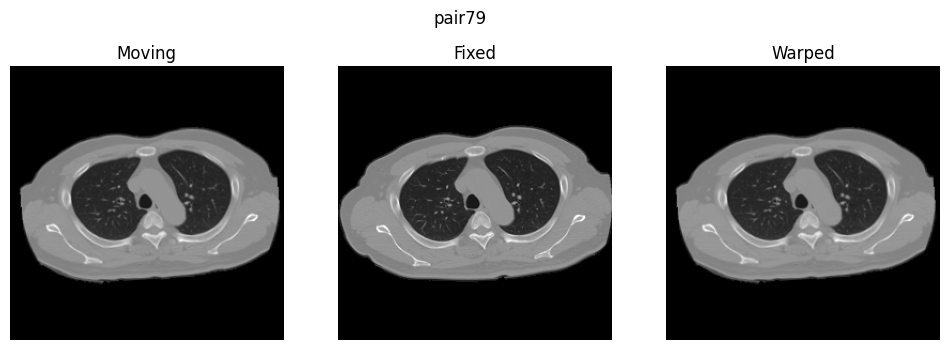

pair80 | RMSE=813.7072 | MS-SSIM=0.7946 | Dice=0.7951


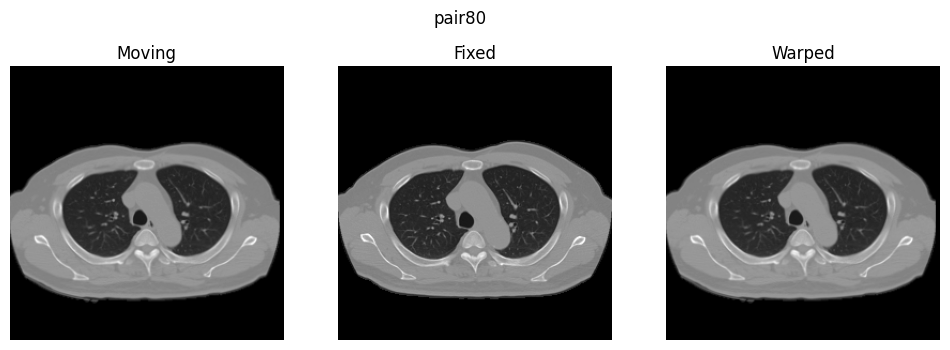

pair81 | RMSE=425.1205 | MS-SSIM=0.8727 | Dice=0.8969


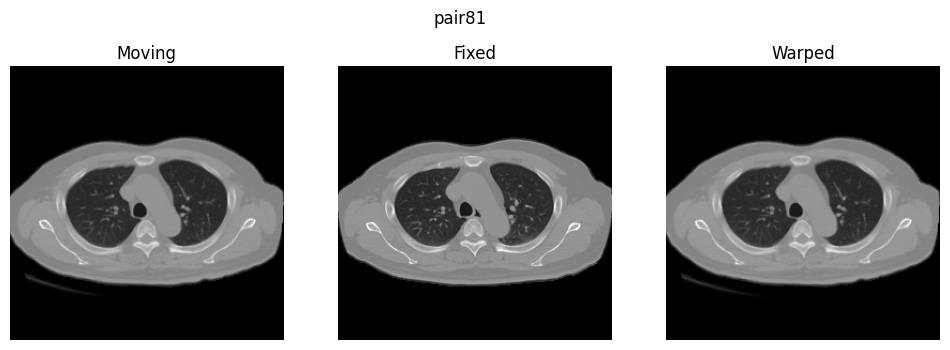

pair82 | RMSE=386.2686 | MS-SSIM=0.8615 | Dice=0.9137


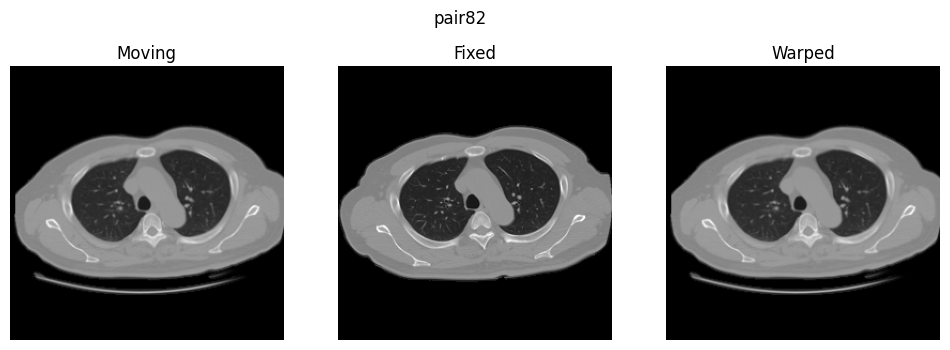

pair83 | RMSE=412.6491 | MS-SSIM=0.8779 | Dice=0.9039


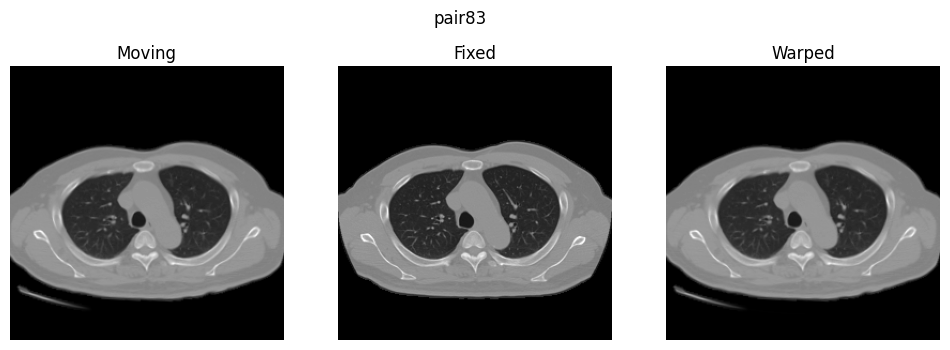

pair84 | RMSE=384.3257 | MS-SSIM=0.8469 | Dice=0.9116


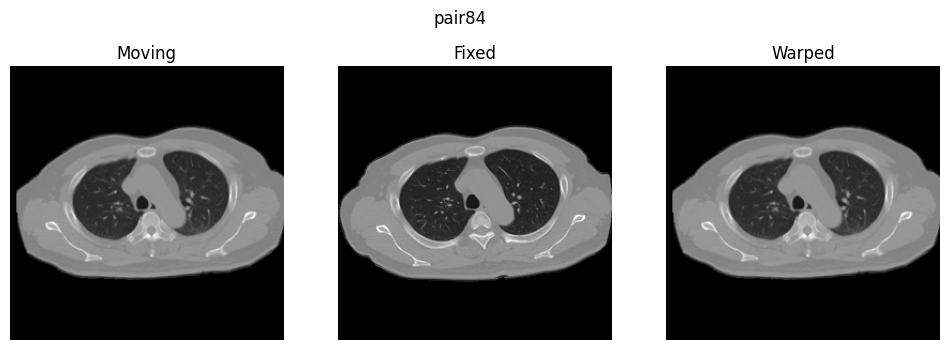

pair85 | RMSE=401.1356 | MS-SSIM=0.8434 | Dice=0.9013


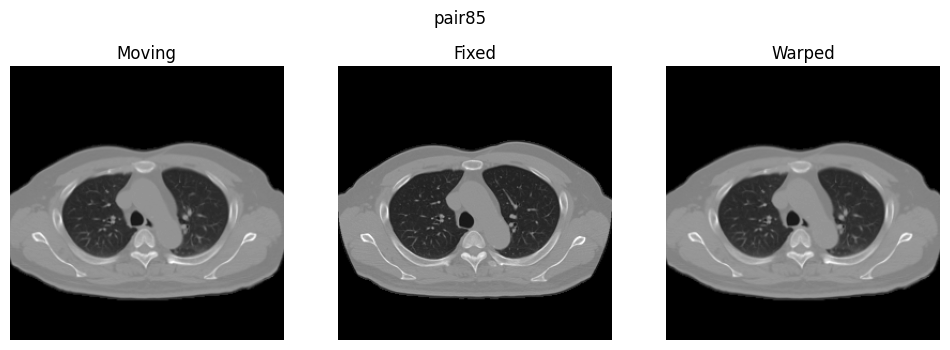

pair86 | RMSE=398.4980 | MS-SSIM=0.8833 | Dice=0.9081


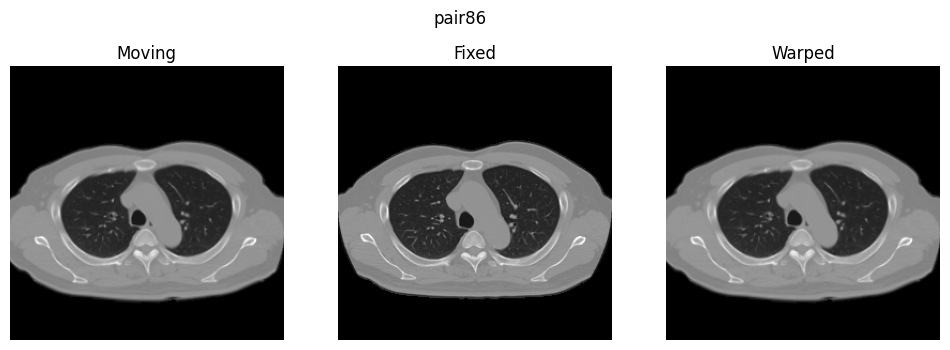

pair87 | RMSE=276.4460 | MS-SSIM=0.9473 | Dice=0.9415


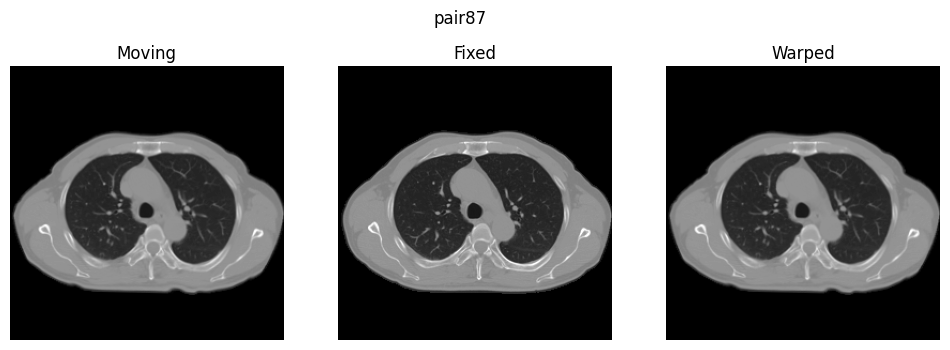

pair88 | RMSE=342.6819 | MS-SSIM=0.9104 | Dice=0.8926


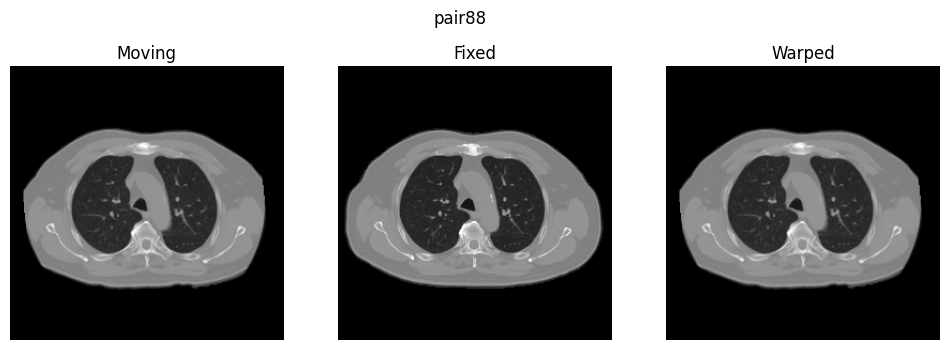

pair89 | RMSE=772.9105 | MS-SSIM=0.7892 | Dice=0.7775


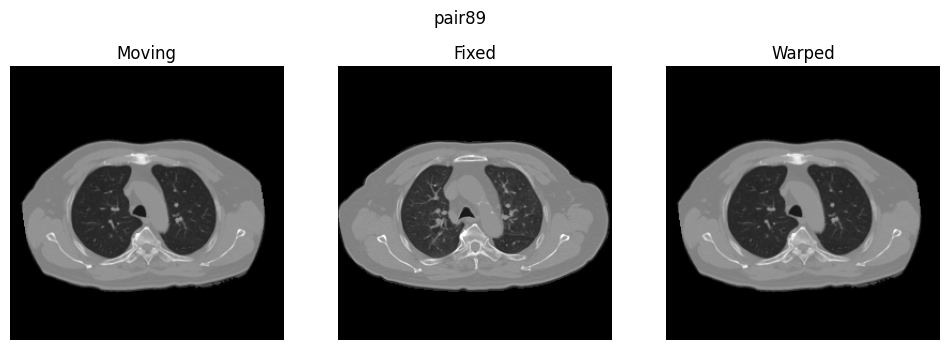

pair90 | RMSE=805.6018 | MS-SSIM=0.7667 | Dice=0.7581


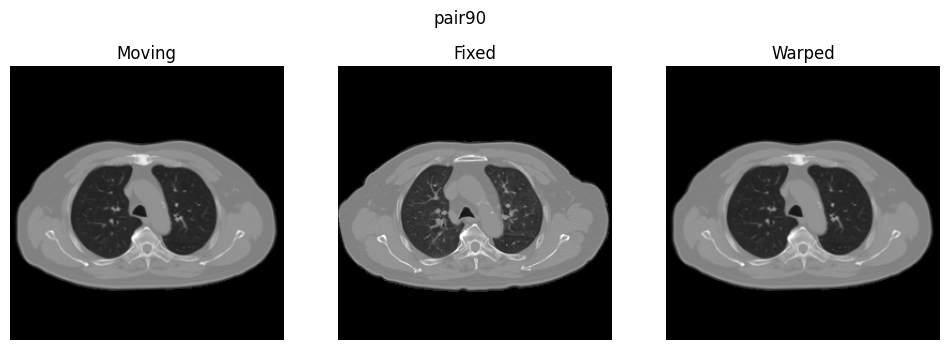

pair91 | RMSE=386.8666 | MS-SSIM=0.8987 | Dice=0.9166


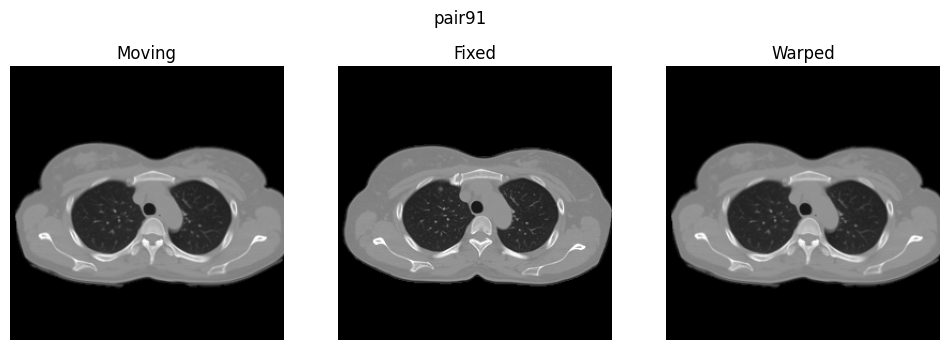

pair92 | RMSE=375.4791 | MS-SSIM=0.8776 | Dice=0.9197


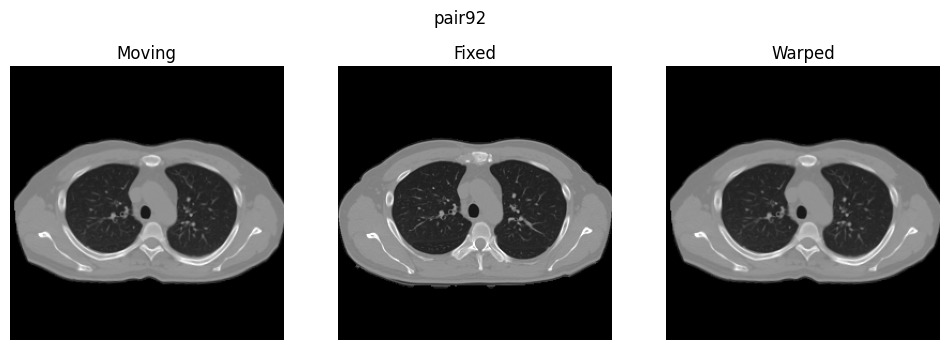

pair93 | RMSE=227.3458 | MS-SSIM=0.9563 | Dice=0.9504


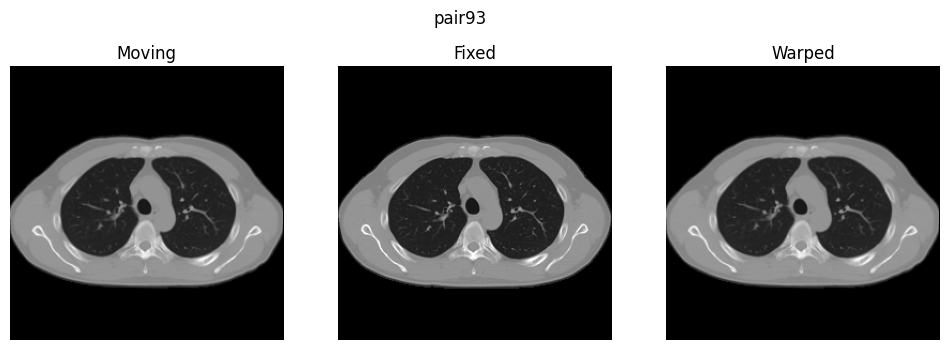

pair94 | RMSE=447.5567 | MS-SSIM=0.9365 | Dice=0.9230


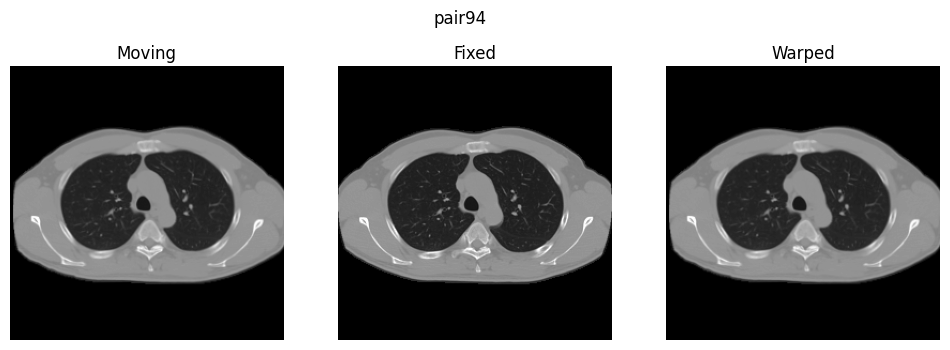

pair95 | RMSE=446.5990 | MS-SSIM=0.9055 | Dice=0.9052


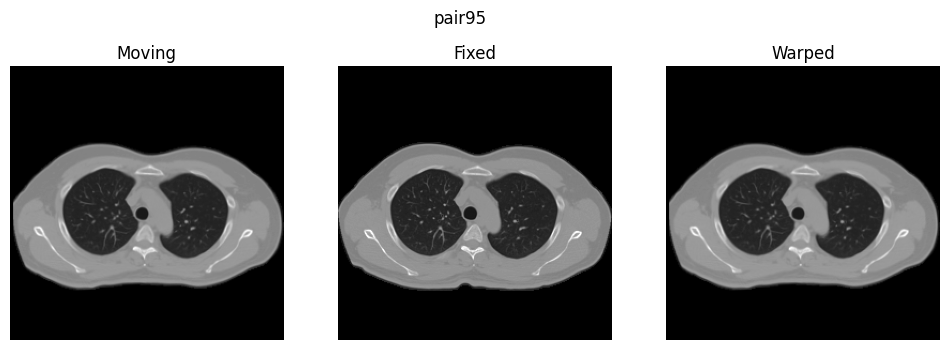

pair96 | RMSE=427.4032 | MS-SSIM=0.8884 | Dice=0.8929


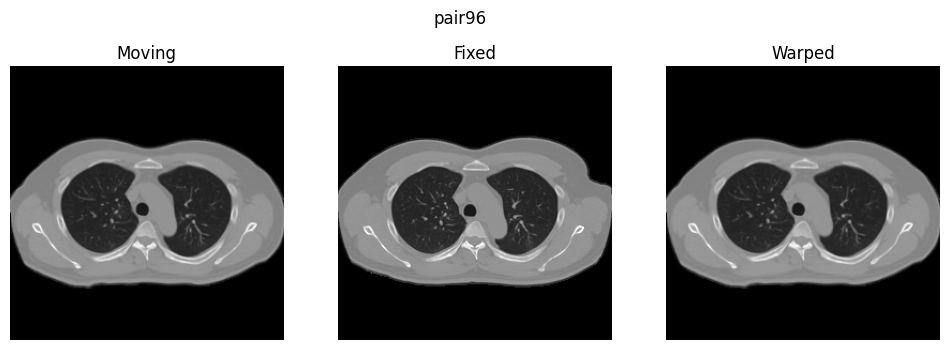

pair97 | RMSE=376.0231 | MS-SSIM=0.8682 | Dice=0.9076


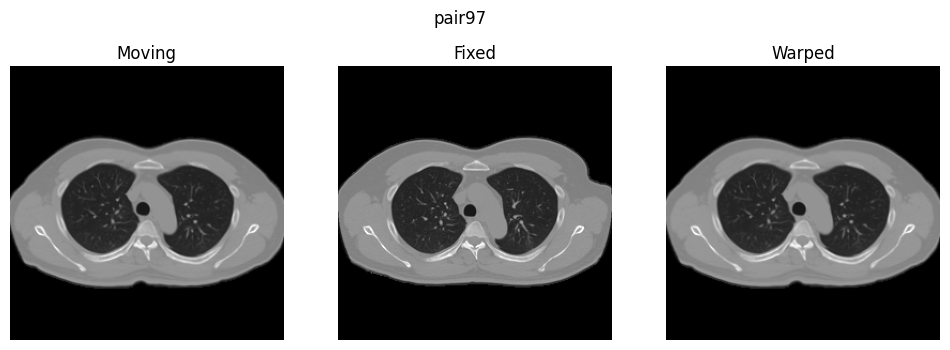

pair98 | RMSE=346.4174 | MS-SSIM=0.8920 | Dice=0.8894


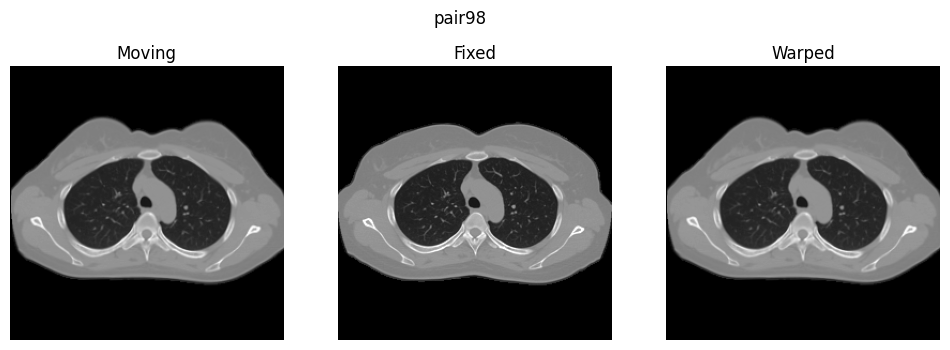

pair99 | RMSE=372.0968 | MS-SSIM=0.8749 | Dice=0.9095


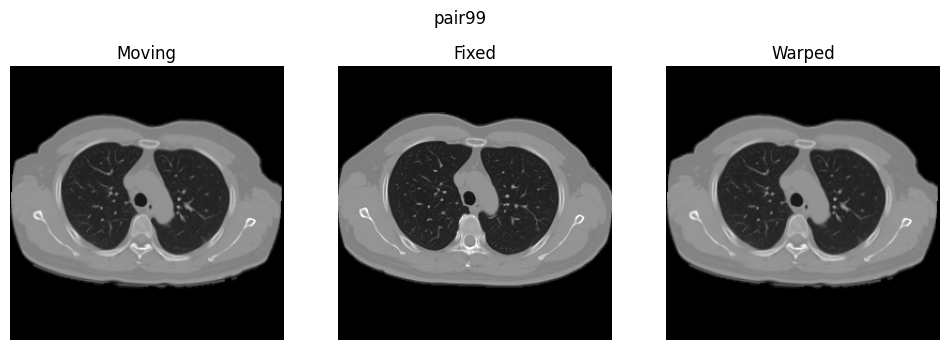

pair100 | RMSE=331.0241 | MS-SSIM=0.9305 | Dice=0.9339


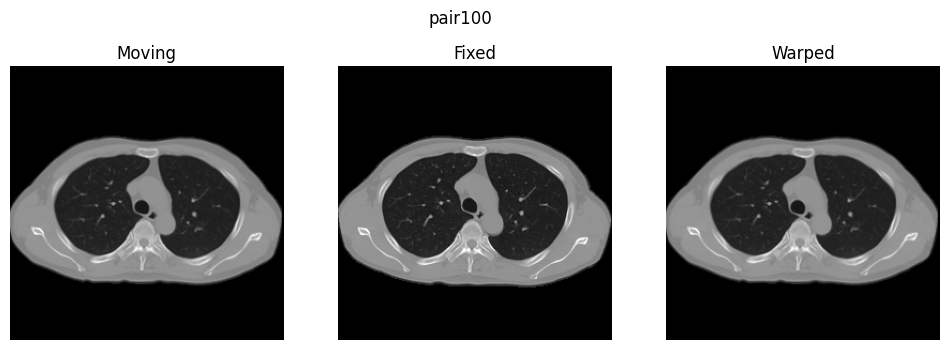

pair101 | RMSE=322.4900 | MS-SSIM=0.9378 | Dice=0.9334


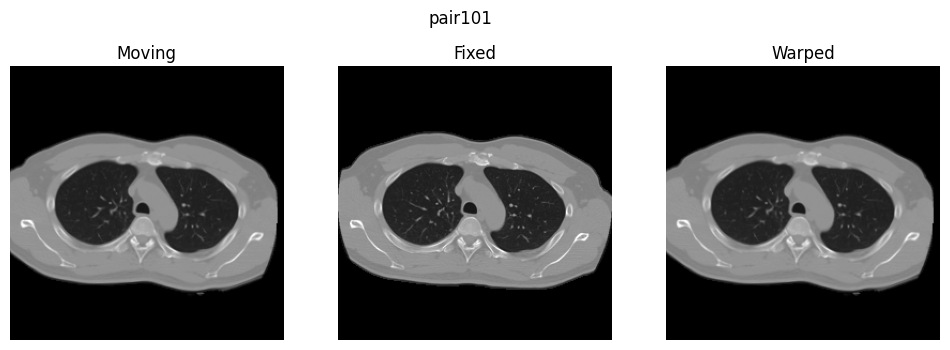

In [9]:
root_dir = r"D:\Saito\Data\TestData"

all_results = []

for i in range(1, 102):
    pair_folder = os.path.join(root_dir, f"pair{i}")
    if not os.path.isdir(pair_folder):
        continue

    process_pair(
        pair_folder=pair_folder,
        model=model,
        transformer=transformer,
        device=device,
        all_results=all_results,
        slice_z=35,
        visualize=True
    )


In [10]:
import pandas as pd

df = pd.DataFrame(all_results)
print(df.describe())

             RMSE     MS_SSIM        Dice
count  101.000000  101.000000  101.000000
mean   436.024514    0.893399    0.894119
std    141.422646    0.044617    0.040651
min    227.345764    0.761122    0.758064
25%    340.886841    0.869371    0.878867
50%    401.135590    0.900995    0.904749
75%    497.728363    0.927095    0.922163
max    849.617981    0.963504    0.950414
